# 1. Imports and Helper Functions

In [1]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.autograd import grad
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from pylab import rcParams
import skvideo.io
import io
import base64
from IPython.display import HTML
rcParams['figure.figsize'] = 10, 10

/home/sungyub/.conda/envs/pytorch/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
def sample_z(u, theta, eps=1e-20):
    return torch.log(theta+eps) - torch.log(-torch.log(u+eps)+eps)

def sample_zb(v, theta, b,ind, eps=1e-20):
    vk = torch.gather(v.view(-1,K), dim=1,index= ind * torch.ones(BATCH_SIZE*N,K).long().cuda())
#     print('vk')
#     print(vk[0])
#     print('1-b')
#     print((1-b)[:10])
    return - torch.log(-torch.log(vk.view(-1,1)+eps) \
                       + (1-b)*(-torch.log(v+eps)/(theta+eps)) +eps)
    
def H(x):
    ind = x.argmax(dim=1, keepdim=True)
    one_hot = torch.zeros_like(x)
    return one_hot.scatter(dim=1, index=ind, source=1), ind

# 2. Build Model

In [3]:
N= 30 # num of categorical distributions
K= 10 # size of categorical distributions

In [4]:
class en_Net(nn.Module):
    def __init__(self, ):
        super(en_Net, self).__init__()
        self.en1 = nn.Linear(784, 512)
        self.en1.weight.data.normal_(0, 0.1)   # initialization
        self.en2 = nn.Linear(512, 256)
        self.en2.weight.data.normal_(0, 0.1)   # initialization
        self.en3 = nn.Linear(256, N*K)
        self.en3.weight.data.normal_(0, 0.1)   # initialization

    def forward(self, x):
        x = F.relu(self.en1(x))
        x = F.relu(self.en2(x))
        logits_y = self.en3(x)
        q_y = F.softmax(logits_y.view(-1,K)).view(-1,1)
            
        return q_y
    
class de_Net(nn.Module):
    def __init__(self, ):
        super(de_Net, self).__init__()
        self.de1 = nn.Linear(N*K, 256)
        self.de1.weight.data.normal_(0, 0.1)
        self.de2 = nn.Linear(256, 512)
        self.de2.weight.data.normal_(0, 0.1)
        self.de3 = nn.Linear(512, 784)
        self.de3.weight.data.normal_(0, 0.1)
        
    def forward(self, b):
        y = F.relu(self.de1(b))
        y = F.relu(self.de2(y))
        logits_x = self.de3(y)
        
        return logits_x

In [5]:
# get data
data = input_data.read_data_sets('/tmp/', one_hot=True).train

Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting /tmp/train-images-idx3-ubyte.gz
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting /tmp/train-labels-idx1-ubyte.gz
Instructions for updating:
Please use tf.one_hot on tensors.
Extracting /tmp/t10k-images-idx3-ubyte.gz
Extracting /tmp/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.


In [6]:
def compute_elbo(b, target, q_y):
    logits_x = de(b.view(-1,N*K))
    bce_loss = (F.binary_cross_entropy(F.sigmoid(logits_x) ,target,\
                                       reduce=False)).sum(dim=1)
    kl_reg = (q_y * (torch.log(q_y)-torch.log(torch.FloatTensor([1./K]).cuda()))).sum(dim=1)
    elbo = -bce_loss - kl_reg
    return elbo, logits_x

In [7]:
NUM_ITERS = 10**4
BATCH_SIZE = 100
LAMBDA = .1
ETA = 1.

In [8]:
en = en_Net().cuda()
de = de_Net().cuda()
en_opt = torch.optim.Adam(en.parameters(),lr=1e-3)
de_opt = torch.optim.Adam(de.parameters(),lr=1e-3)

/home/sungyub/.conda/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  from ipykernel import kernelapp as app
/home/sungyub/.conda/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:72: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


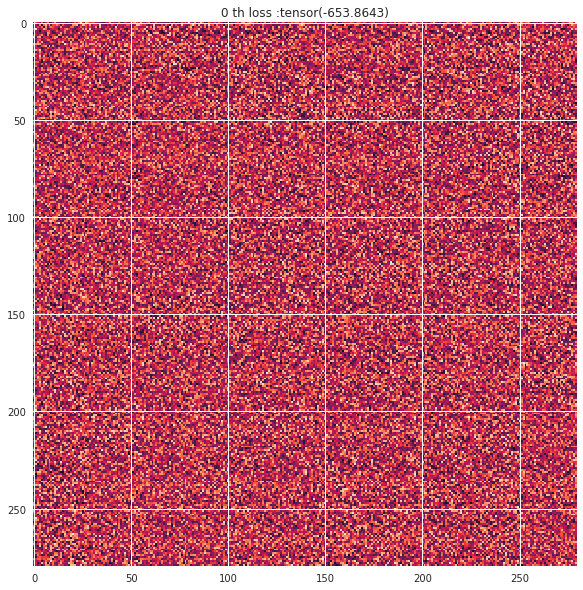

SF
tensor(-236.2230, device='cuda:0')
PD
tensor(648.5665, device='cuda:0')


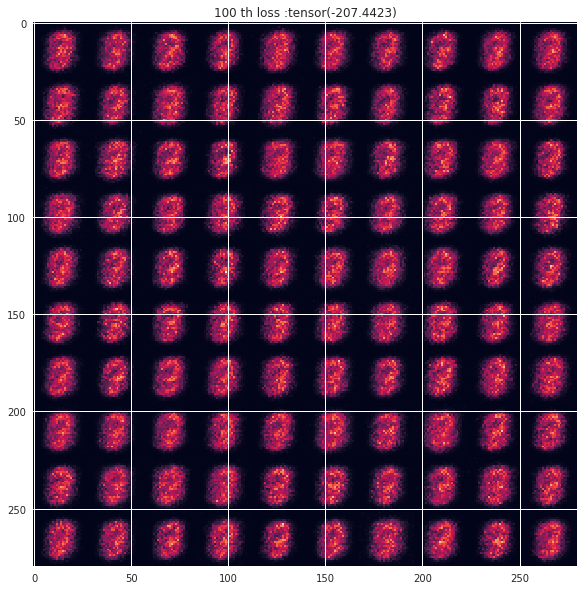

SF
tensor(-28.0922, device='cuda:0')
PD
tensor(207.0164, device='cuda:0')


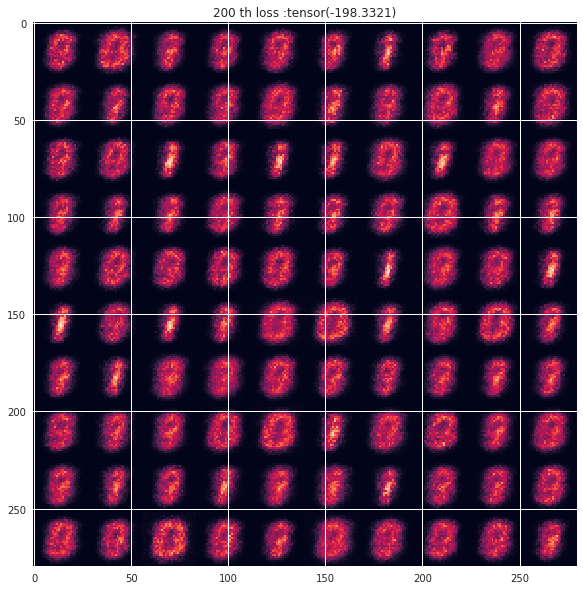

SF
tensor(-22.2183, device='cuda:0')
PD
tensor(197.8433, device='cuda:0')


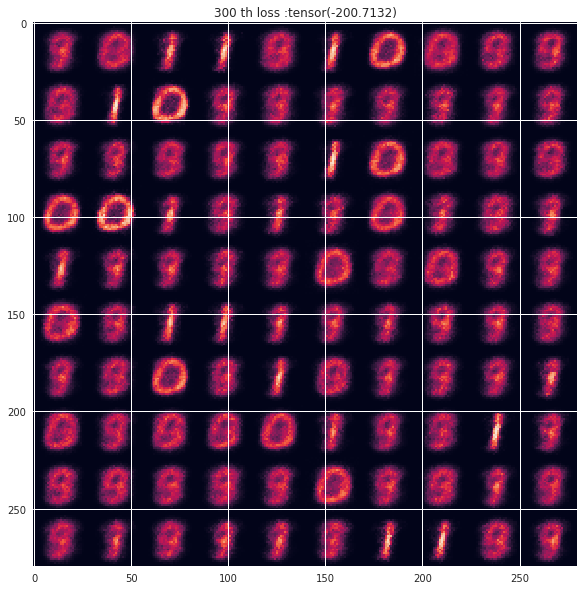

SF
tensor(-59.1079, device='cuda:0')
PD
tensor(200.1091, device='cuda:0')


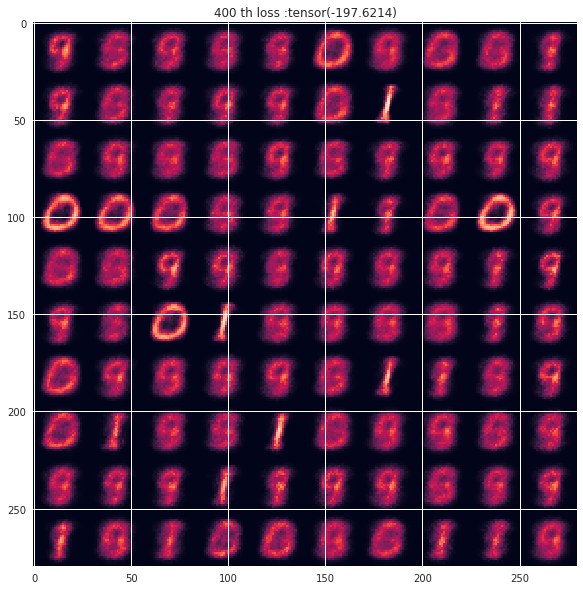

SF
tensor(-24.7171, device='cuda:0')
PD
tensor(197.3494, device='cuda:0')


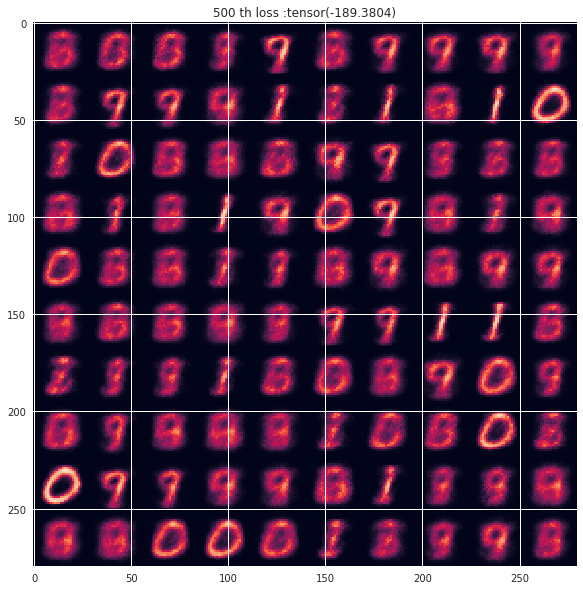

SF
tensor(-26.3374, device='cuda:0')
PD
tensor(188.7029, device='cuda:0')


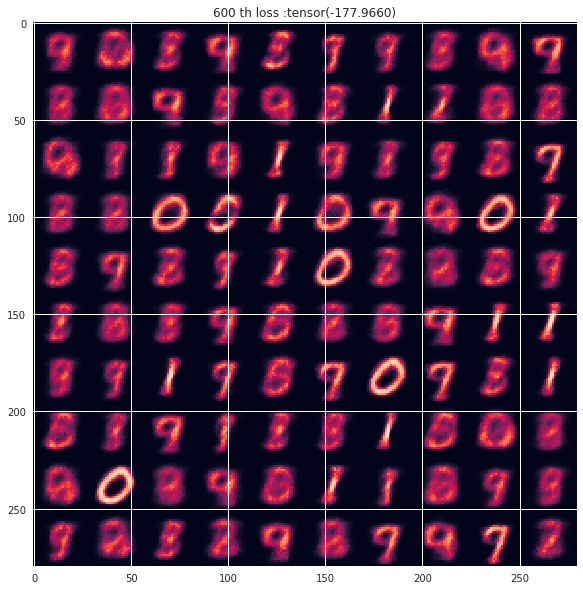

SF
tensor(-43.7798, device='cuda:0')
PD
tensor(177.1228, device='cuda:0')


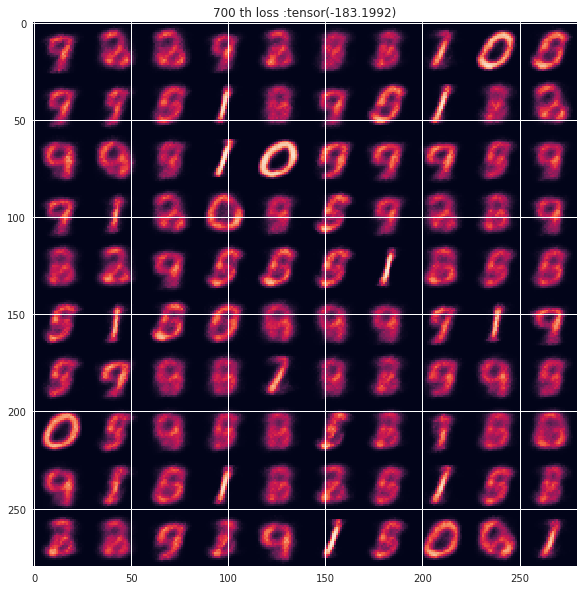

SF
tensor(-65.2747, device='cuda:0')
PD
tensor(182.3963, device='cuda:0')


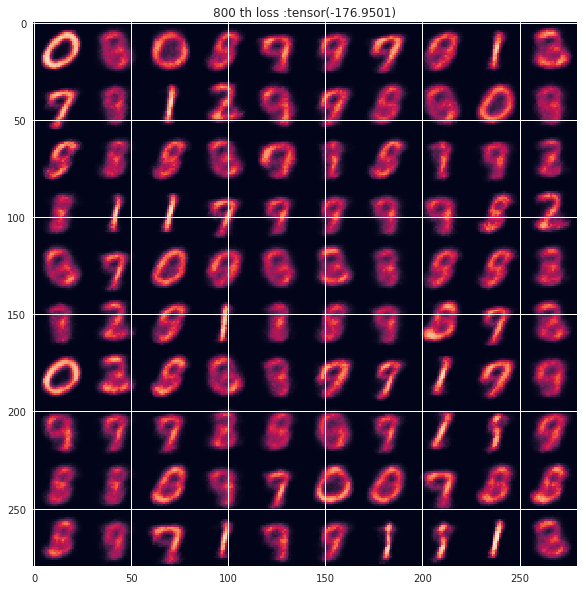

SF
tensor(-71.0790, device='cuda:0')
PD
tensor(175.9262, device='cuda:0')


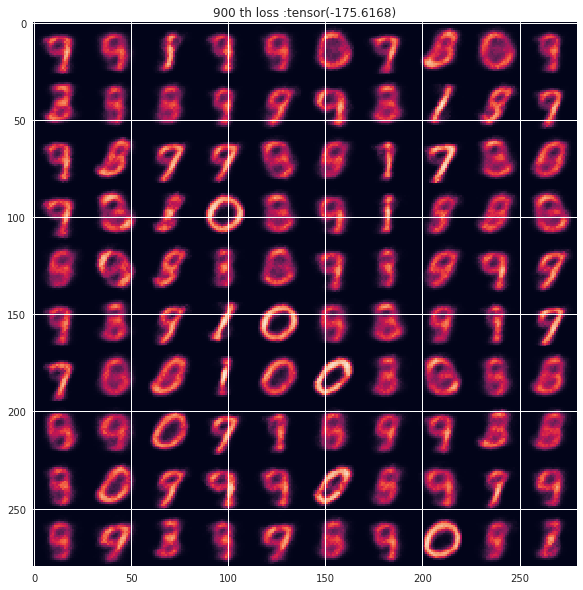

SF
tensor(-80.6486, device='cuda:0')
PD
tensor(174.8657, device='cuda:0')


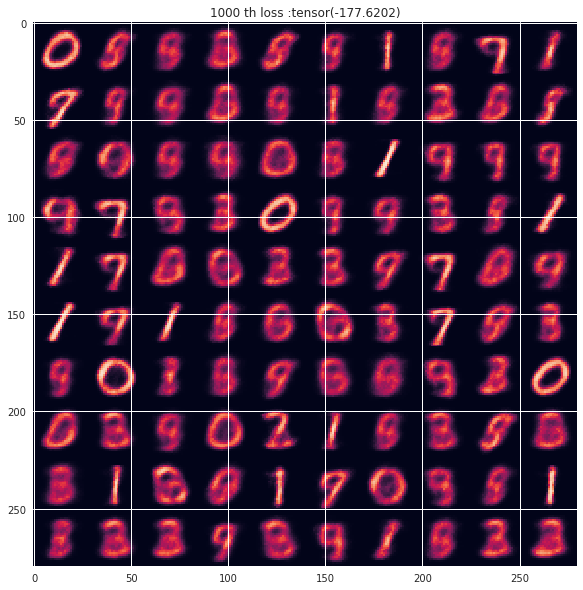

SF
tensor(-74.6376, device='cuda:0')
PD
tensor(176.1878, device='cuda:0')


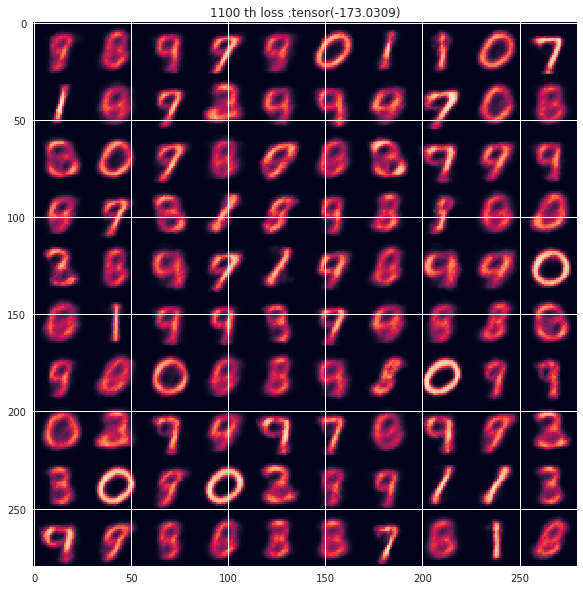

SF
tensor(-48.6993, device='cuda:0')
PD
tensor(172.1273, device='cuda:0')


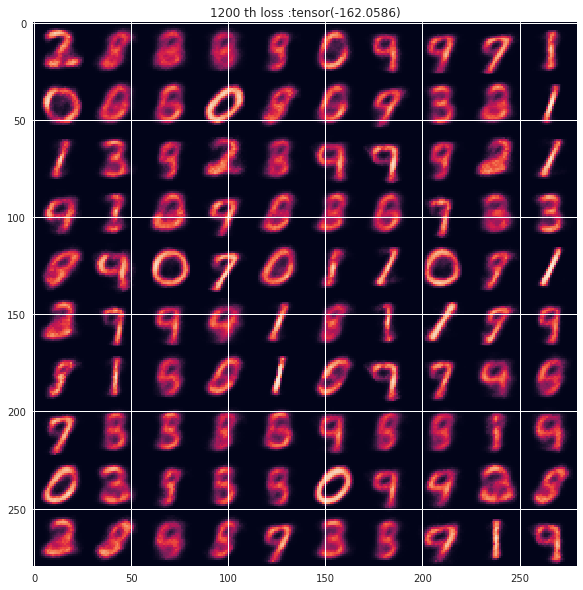

SF
tensor(-57.9150, device='cuda:0')
PD
tensor(161.2880, device='cuda:0')


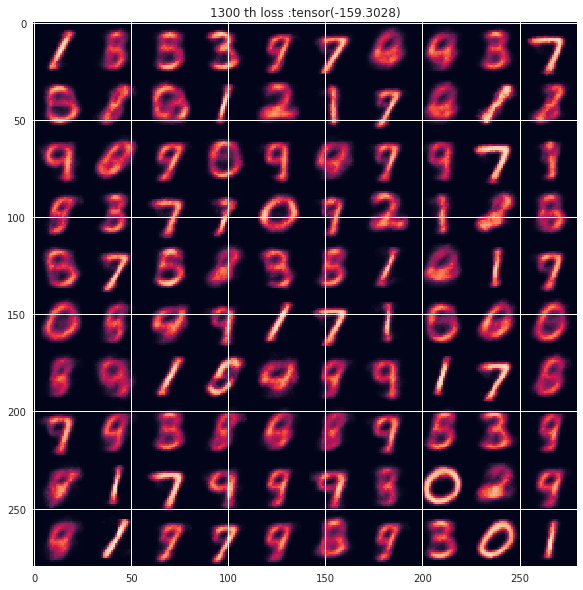

SF
tensor(-84.4595, device='cuda:0')
PD
tensor(157.6176, device='cuda:0')


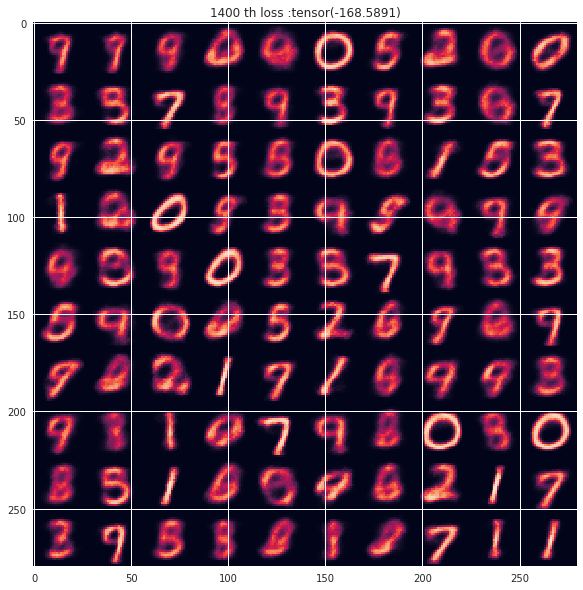

SF
tensor(-77.7155, device='cuda:0')
PD
tensor(167.4257, device='cuda:0')


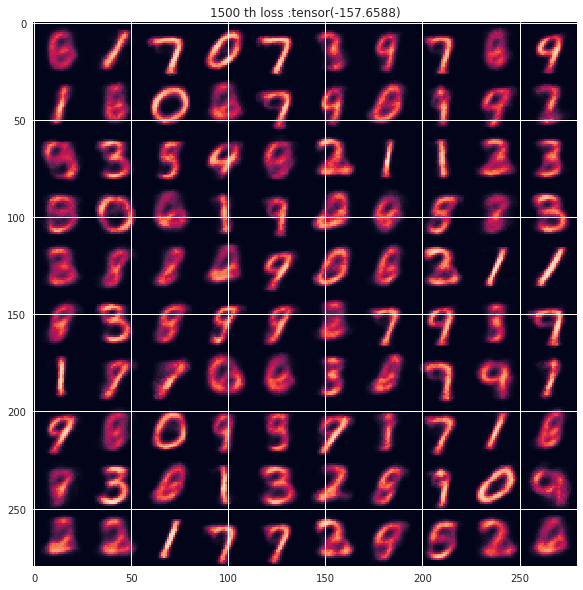

SF
tensor(-89.1296, device='cuda:0')
PD
tensor(155.8968, device='cuda:0')


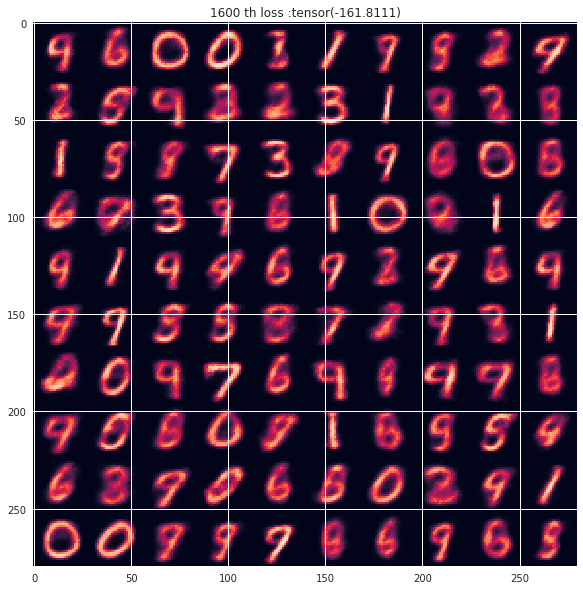

SF
tensor(-110.8267, device='cuda:0')
PD
tensor(160.6392, device='cuda:0')


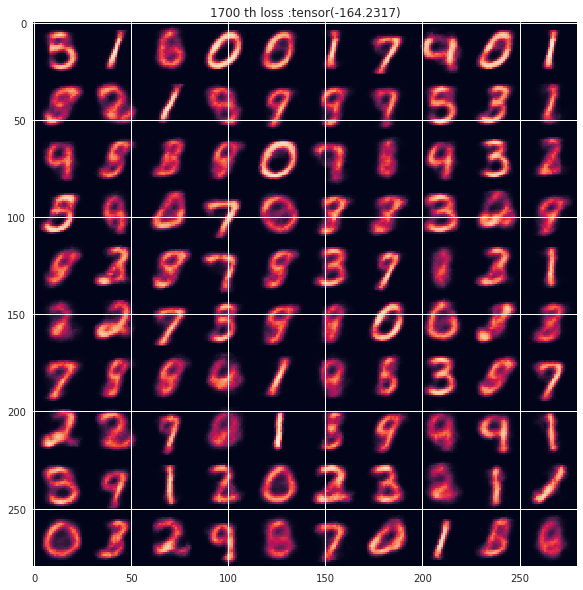

SF
tensor(-134.1085, device='cuda:0')
PD
tensor(162.2513, device='cuda:0')


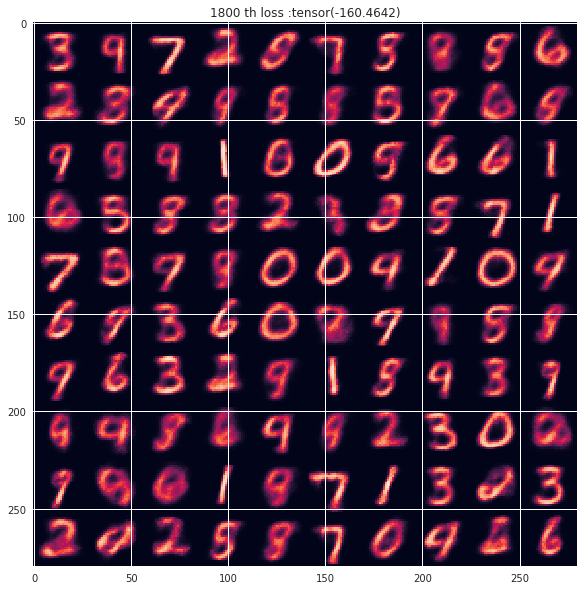

SF
tensor(-92.2907, device='cuda:0')
PD
tensor(158.8494, device='cuda:0')


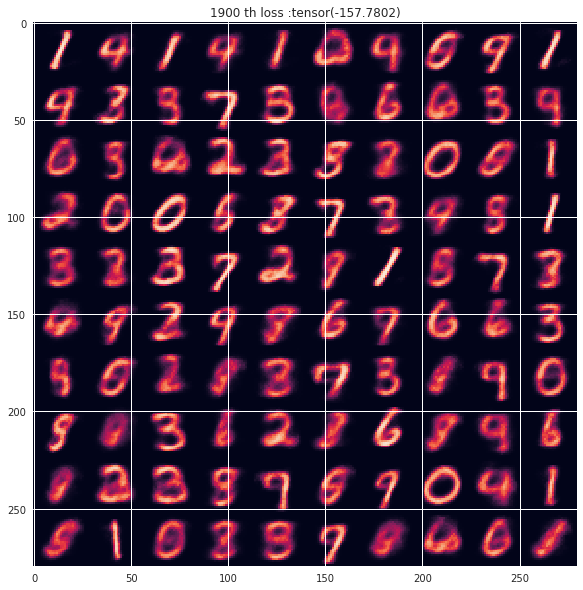

SF
tensor(-93.7646, device='cuda:0')
PD
tensor(156.5184, device='cuda:0')


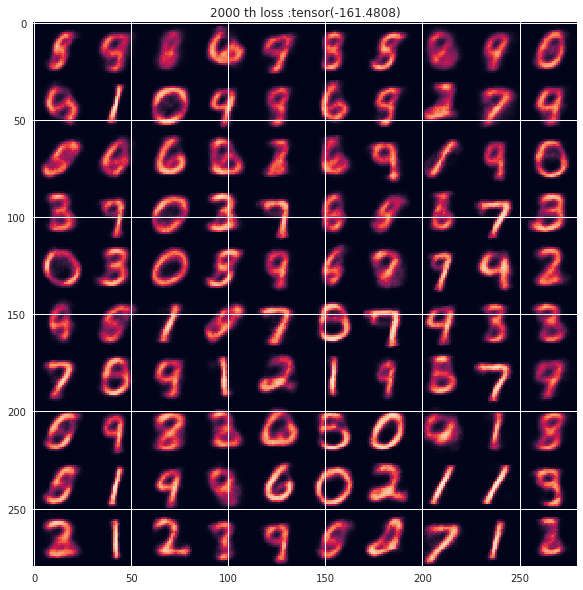

SF
tensor(-67.0607, device='cuda:0')
PD
tensor(160.0514, device='cuda:0')


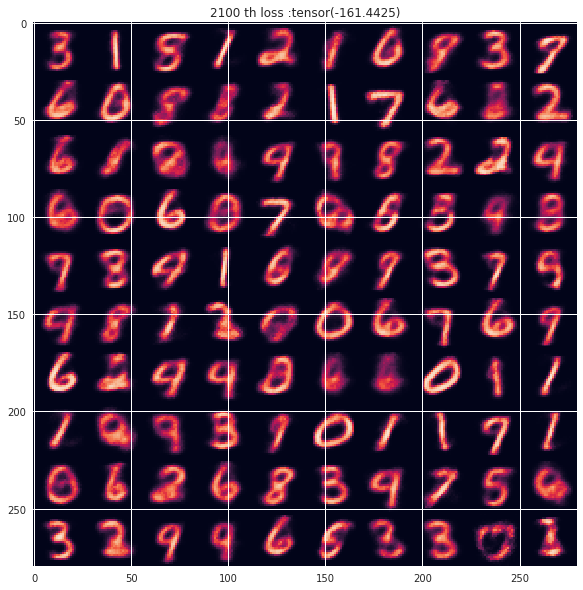

SF
tensor(-107.3785, device='cuda:0')
PD
tensor(159.2352, device='cuda:0')


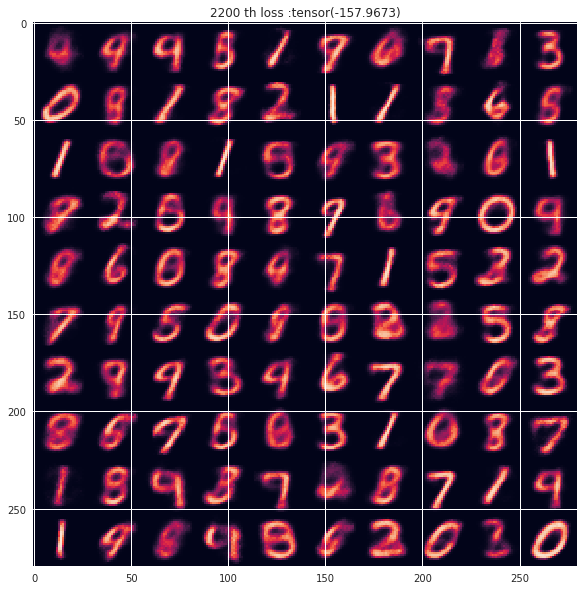

SF
tensor(-118.7176, device='cuda:0')
PD
tensor(156.6256, device='cuda:0')


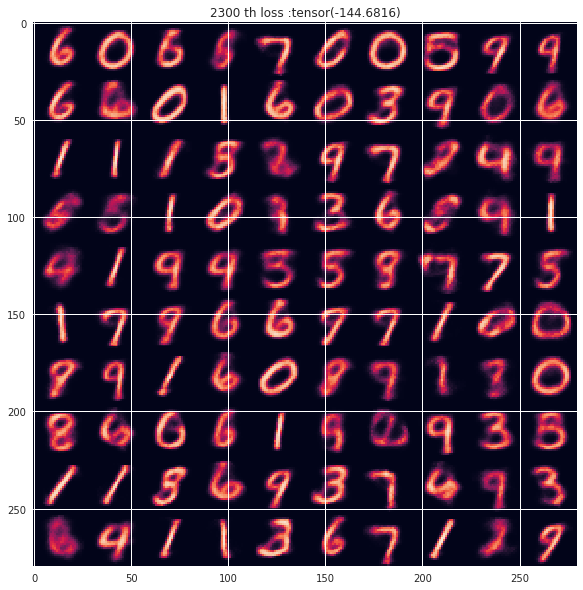

SF
tensor(-82.2572, device='cuda:0')
PD
tensor(143.0019, device='cuda:0')


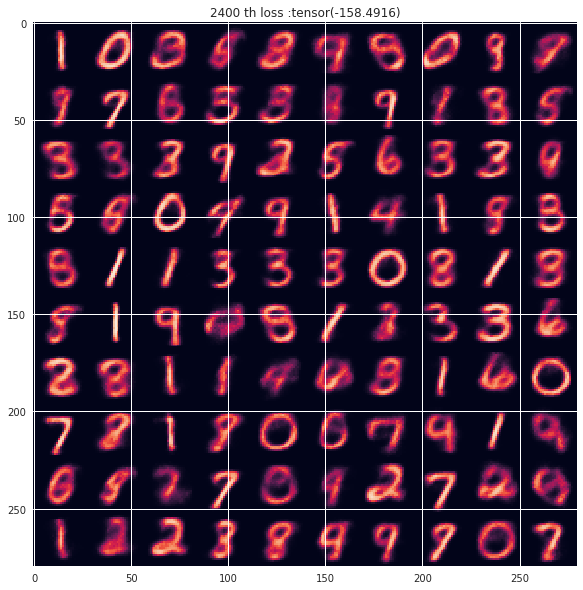

SF
tensor(-140.1140, device='cuda:0')
PD
tensor(156.9173, device='cuda:0')


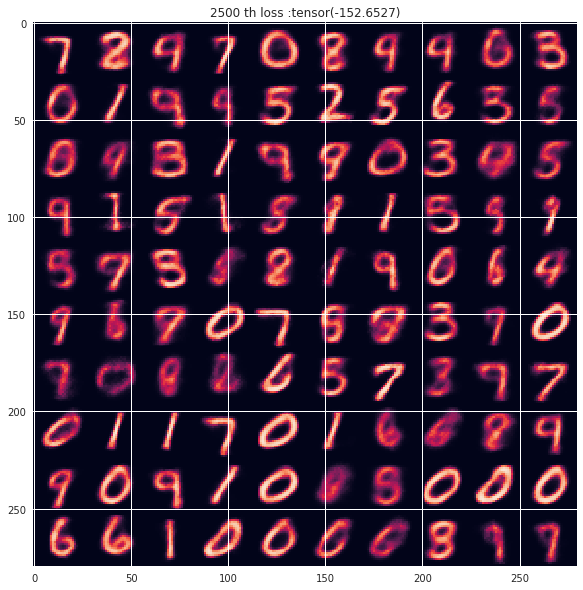

SF
tensor(-116.5705, device='cuda:0')
PD
tensor(151.1408, device='cuda:0')


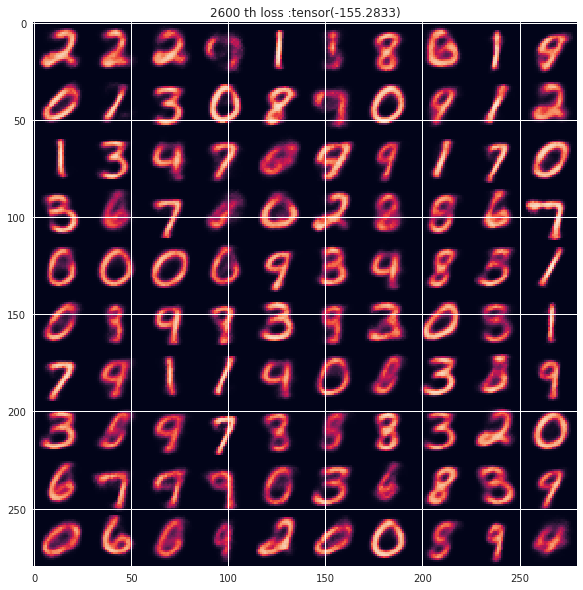

SF
tensor(-75.6556, device='cuda:0')
PD
tensor(153.2503, device='cuda:0')


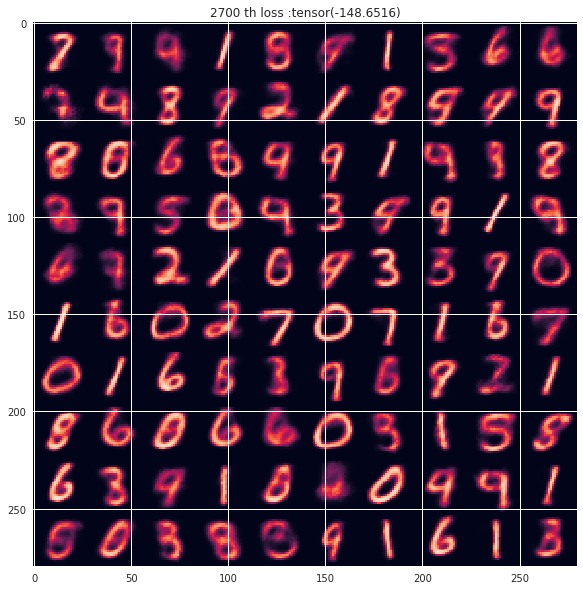

SF
tensor(-145.9916, device='cuda:0')
PD
tensor(146.7950, device='cuda:0')


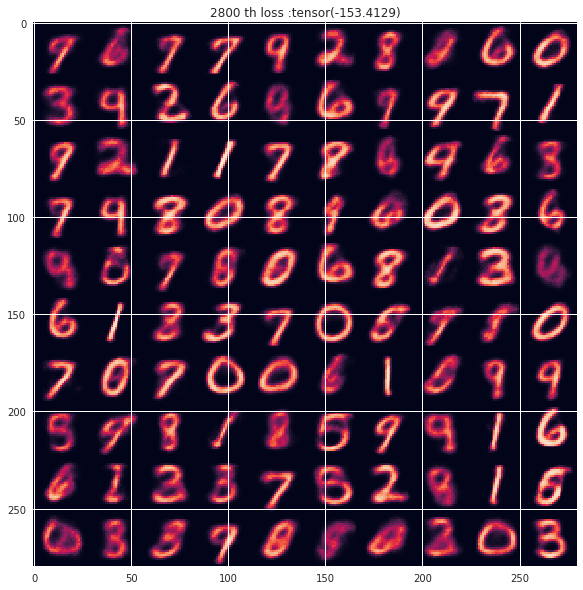

SF
tensor(-125.2174, device='cuda:0')
PD
tensor(151.0287, device='cuda:0')


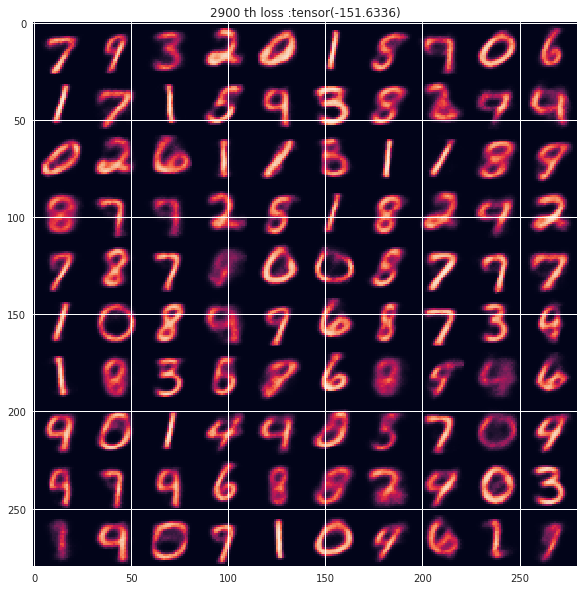

SF
tensor(-138.5272, device='cuda:0')
PD
tensor(149.6885, device='cuda:0')


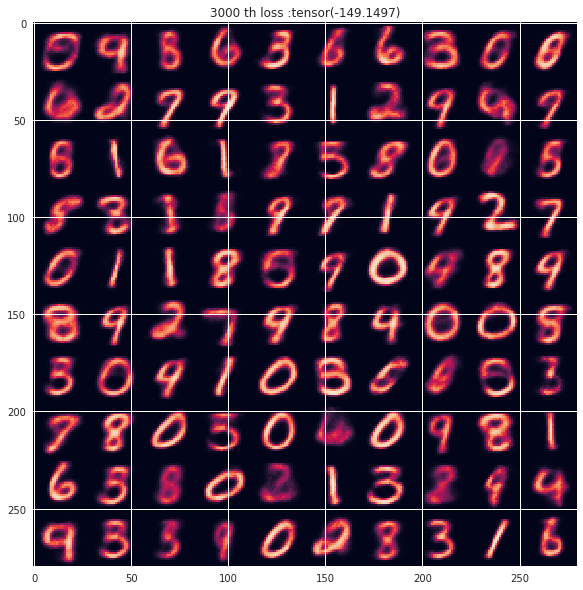

SF
tensor(-91.8358, device='cuda:0')
PD
tensor(147.9897, device='cuda:0')


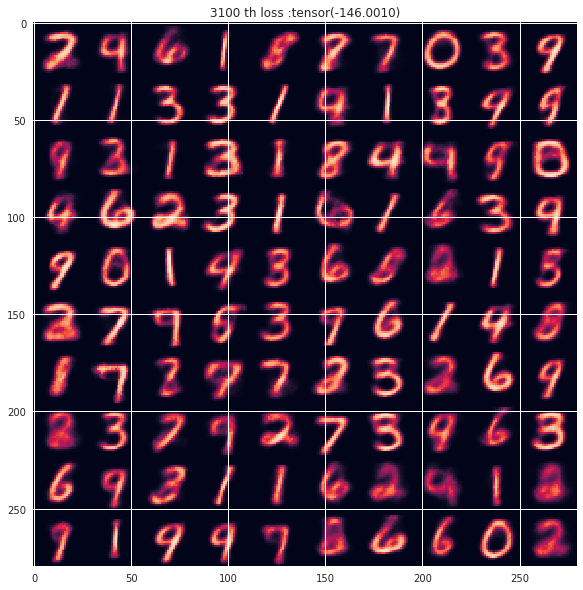

SF
tensor(-124.5163, device='cuda:0')
PD
tensor(143.7848, device='cuda:0')


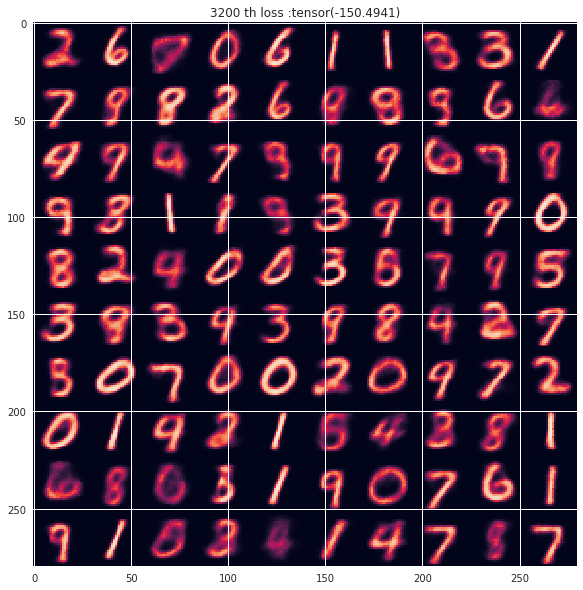

SF
tensor(-75.7257, device='cuda:0')
PD
tensor(149.0472, device='cuda:0')


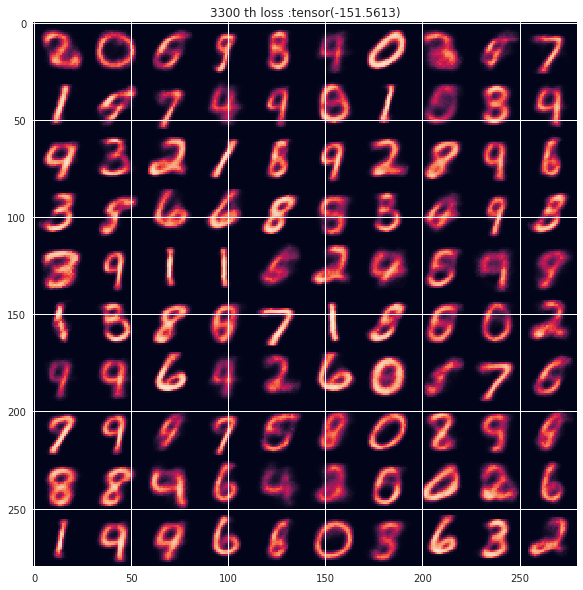

SF
tensor(-102.7599, device='cuda:0')
PD
tensor(149.4556, device='cuda:0')


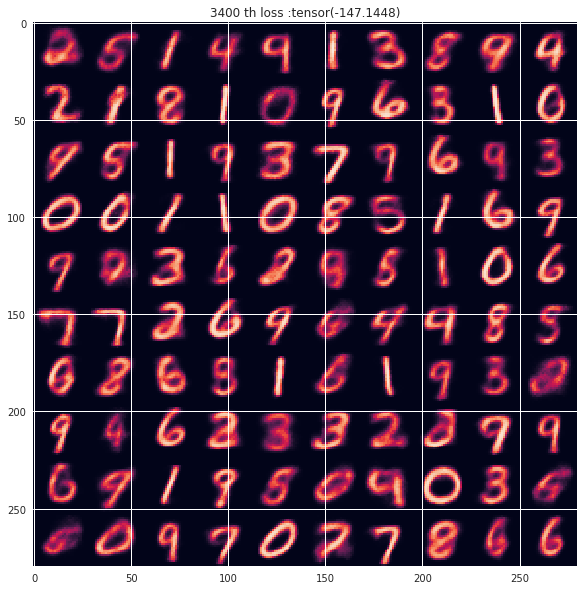

SF
tensor(-128.2113, device='cuda:0')
PD
tensor(145.7424, device='cuda:0')


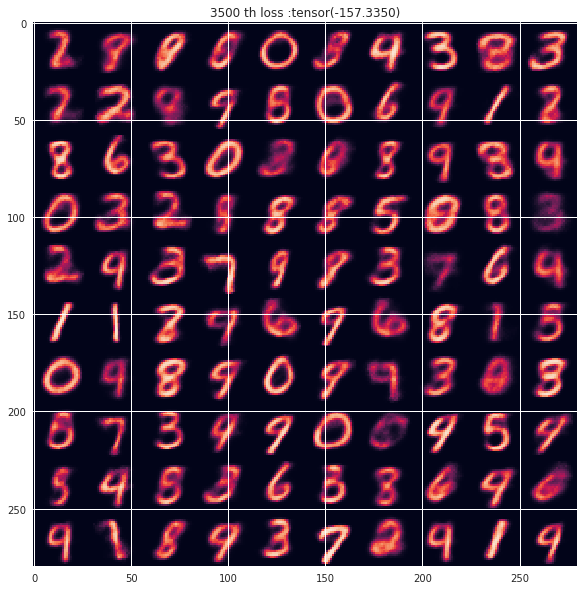

SF
tensor(-107.6152, device='cuda:0')
PD
tensor(155.4861, device='cuda:0')


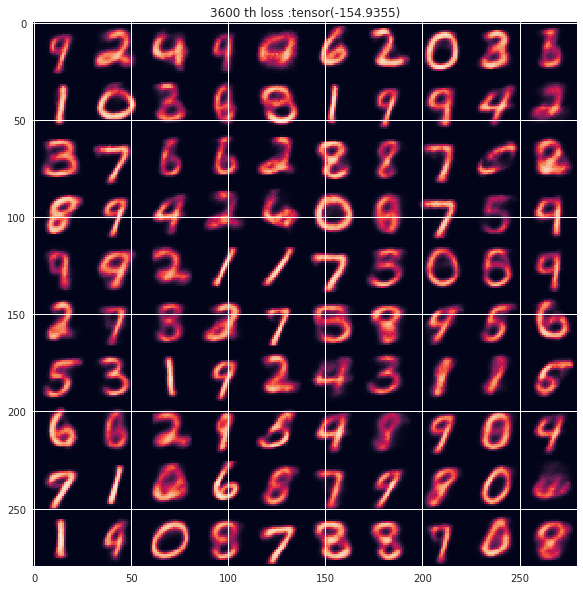

SF
tensor(-116.4243, device='cuda:0')
PD
tensor(154.0103, device='cuda:0')


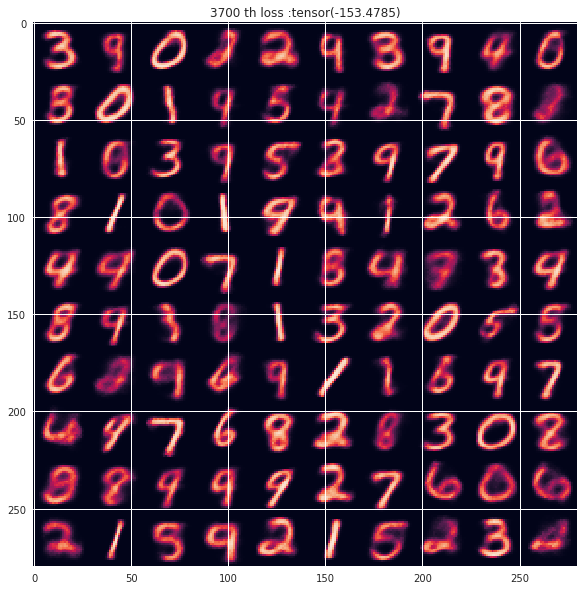

SF
tensor(-119.6131, device='cuda:0')
PD
tensor(151.6005, device='cuda:0')


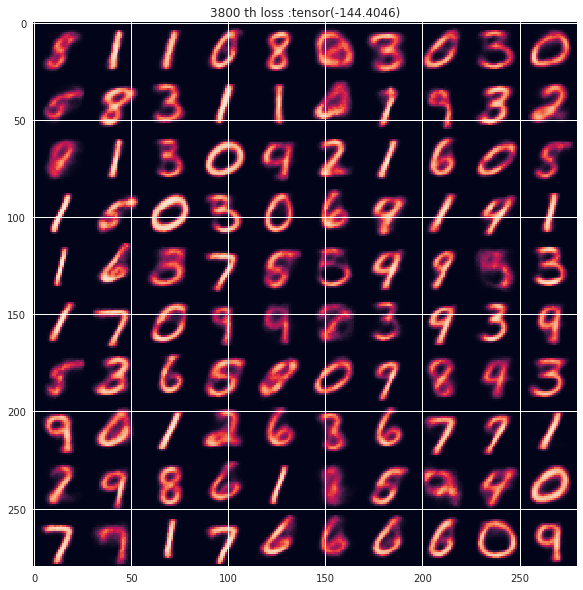

SF
tensor(-95.5311, device='cuda:0')
PD
tensor(142.4784, device='cuda:0')


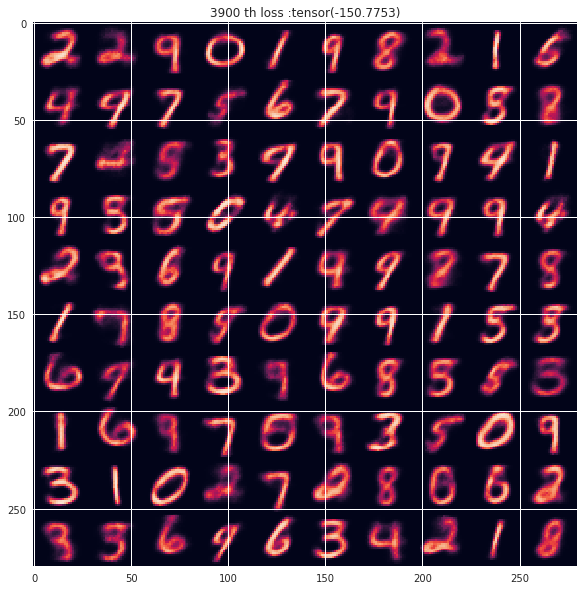

SF
tensor(-128.3121, device='cuda:0')
PD
tensor(149.3289, device='cuda:0')


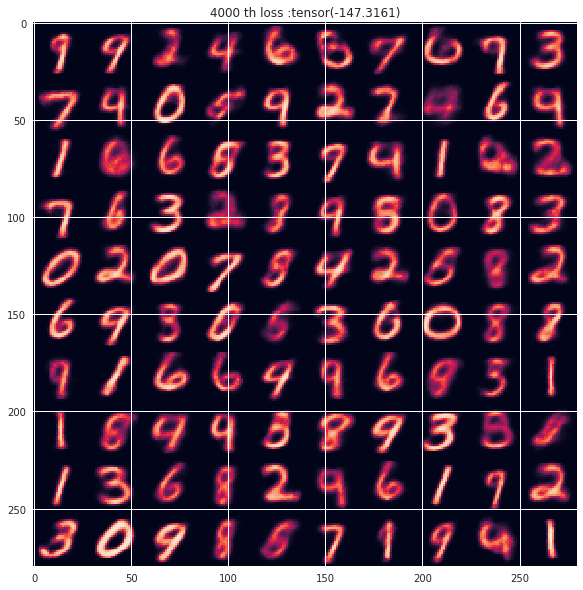

SF
tensor(-68.7669, device='cuda:0')
PD
tensor(146.0471, device='cuda:0')


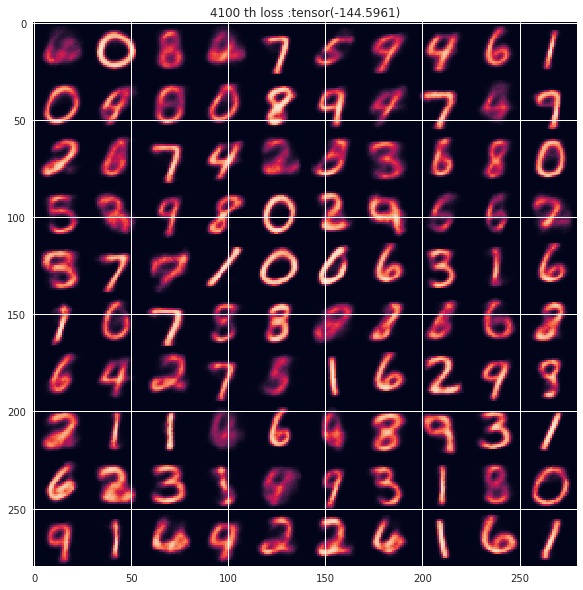

SF
tensor(-113.3808, device='cuda:0')
PD
tensor(143.3781, device='cuda:0')


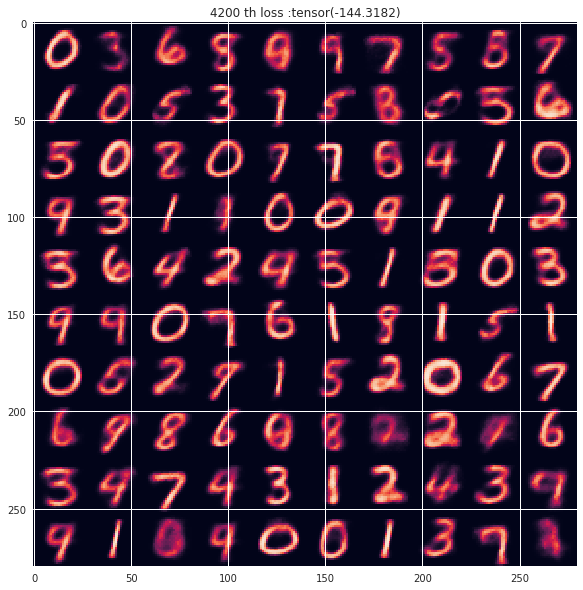

SF
tensor(-117.8051, device='cuda:0')
PD
tensor(143.0051, device='cuda:0')


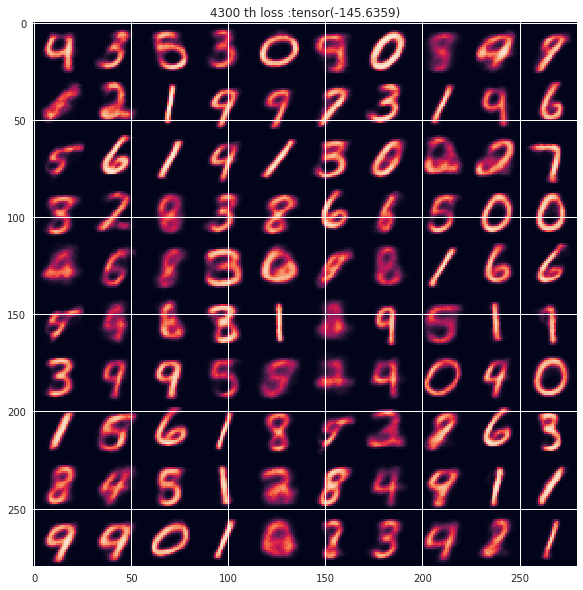

SF
tensor(-92.8907, device='cuda:0')
PD
tensor(144.2932, device='cuda:0')


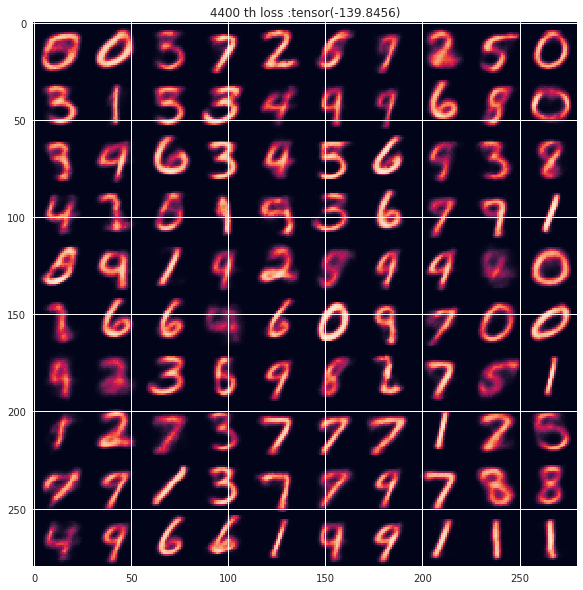

SF
tensor(-112.0335, device='cuda:0')
PD
tensor(138.0502, device='cuda:0')


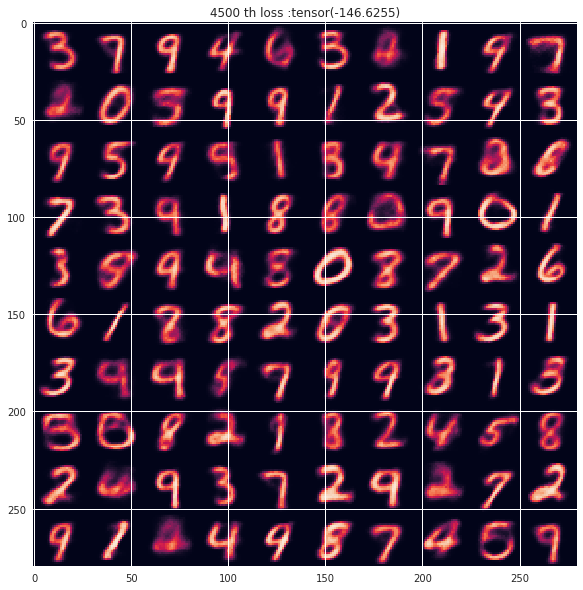

SF
tensor(-62.7329, device='cuda:0')
PD
tensor(144.9536, device='cuda:0')


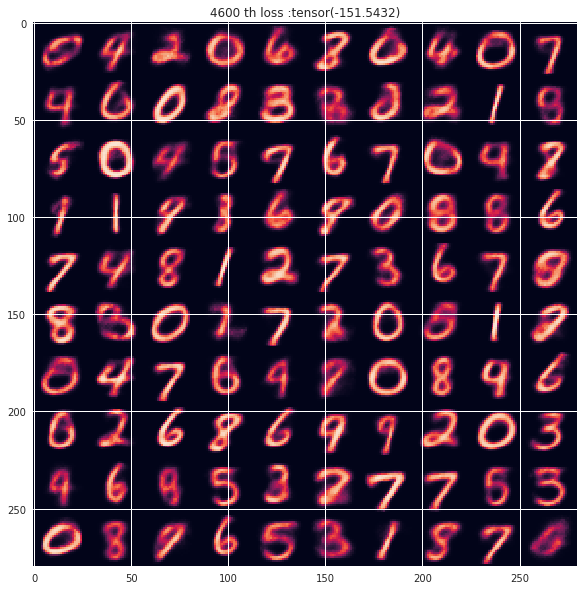

SF
tensor(-135.0668, device='cuda:0')
PD
tensor(149.7901, device='cuda:0')


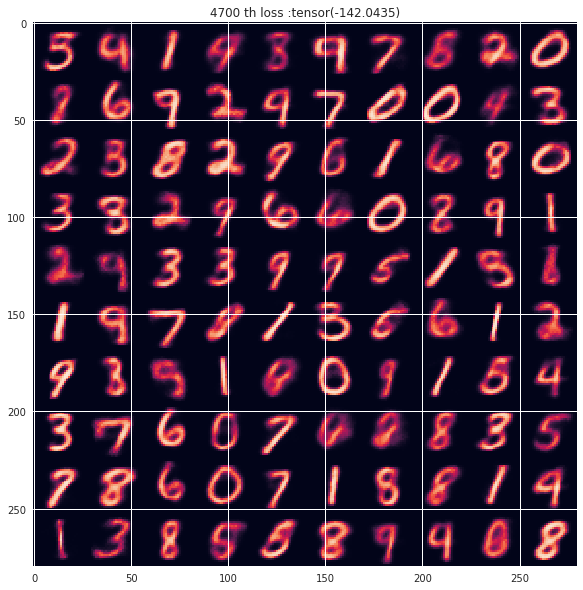

SF
tensor(-116.0501, device='cuda:0')
PD
tensor(140.5298, device='cuda:0')


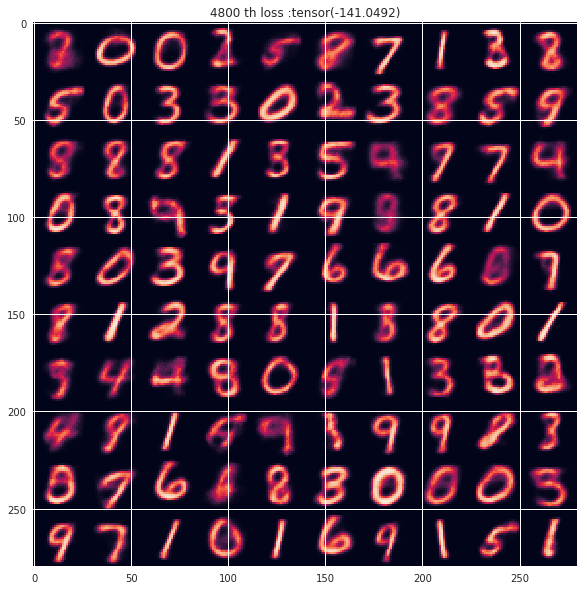

SF
tensor(-122.3167, device='cuda:0')
PD
tensor(139.6274, device='cuda:0')


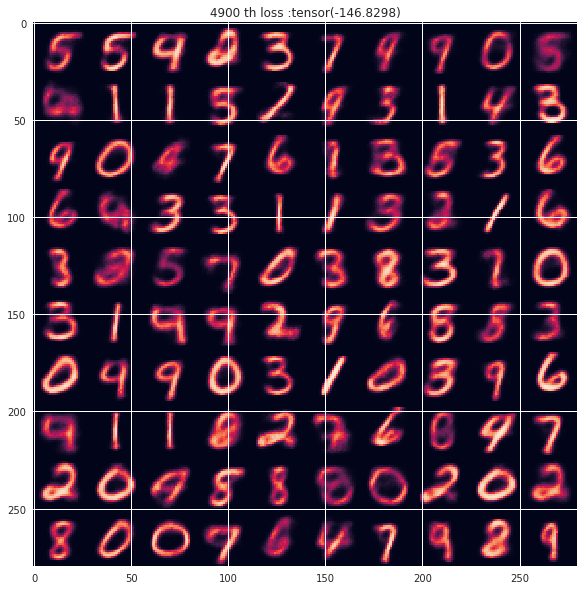

SF
tensor(-111.2975, device='cuda:0')
PD
tensor(144.5551, device='cuda:0')


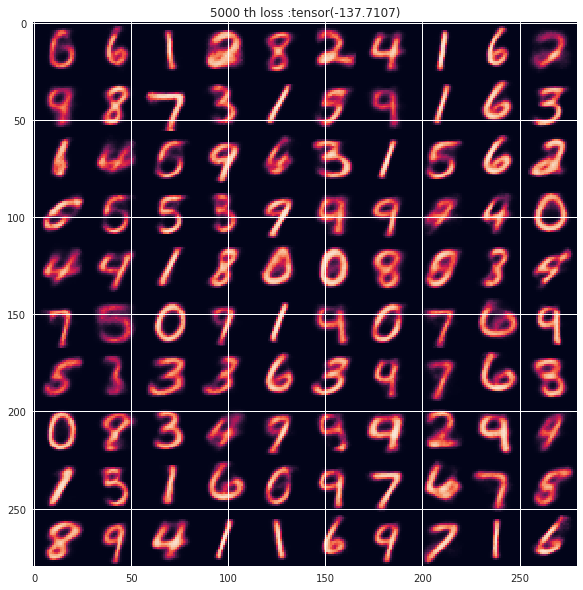

SF
tensor(-68.4148, device='cuda:0')
PD
tensor(136.2424, device='cuda:0')


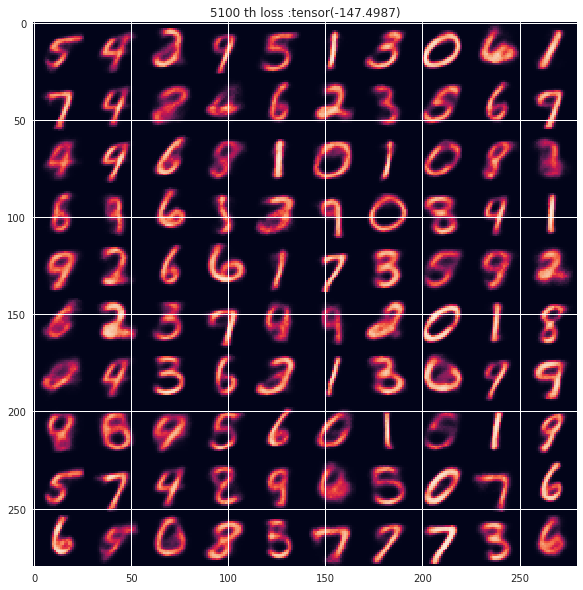

SF
tensor(-125.4528, device='cuda:0')
PD
tensor(145.4729, device='cuda:0')


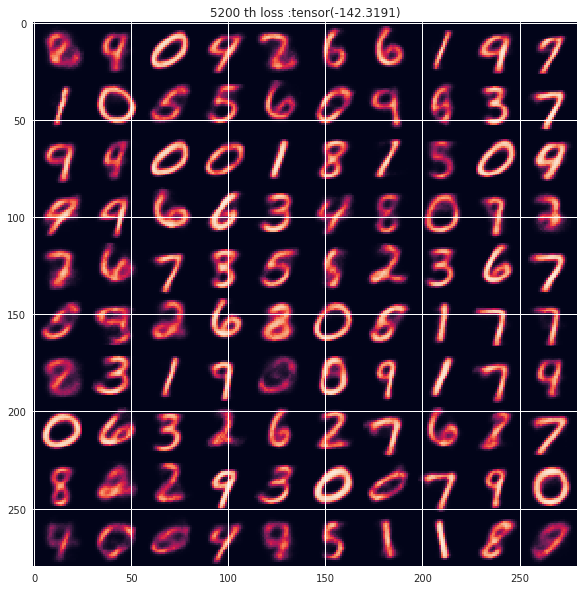

SF
tensor(-155.7686, device='cuda:0')
PD
tensor(140.8550, device='cuda:0')


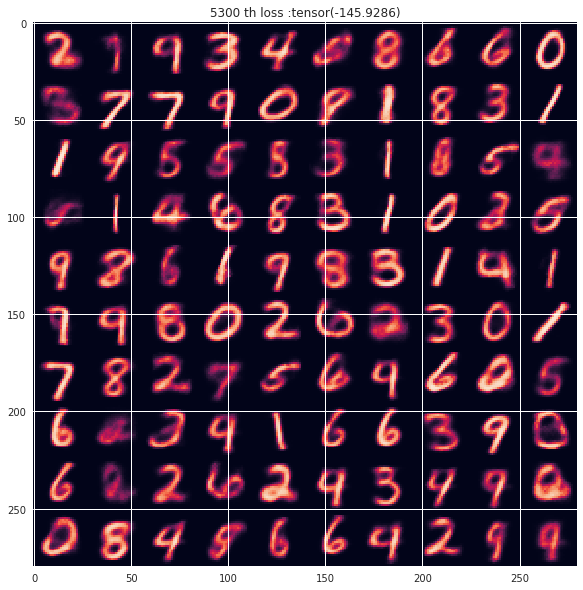

SF
tensor(-110.7878, device='cuda:0')
PD
tensor(144.6550, device='cuda:0')


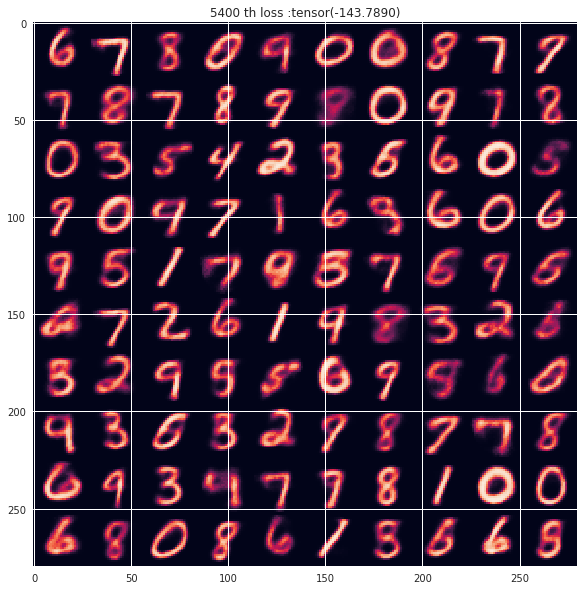

SF
tensor(-98.8225, device='cuda:0')
PD
tensor(142.3735, device='cuda:0')


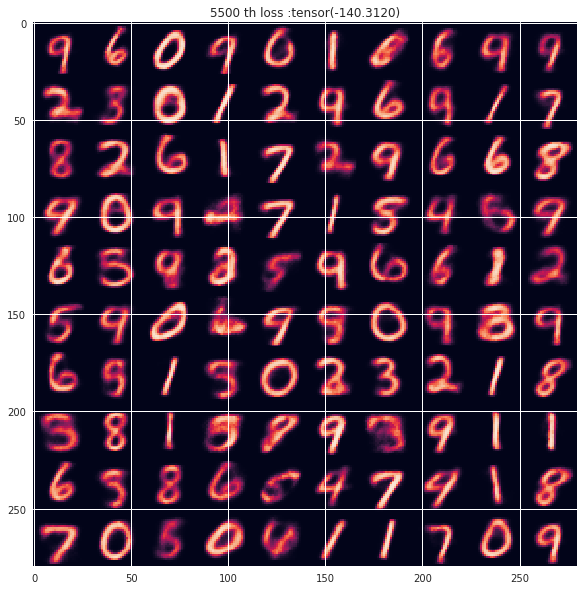

SF
tensor(-80.2485, device='cuda:0')
PD
tensor(138.6206, device='cuda:0')


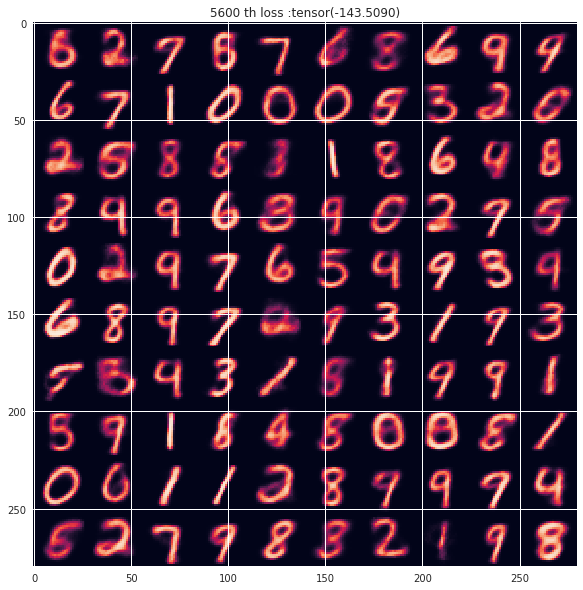

SF
tensor(-105.5297, device='cuda:0')
PD
tensor(141.7201, device='cuda:0')


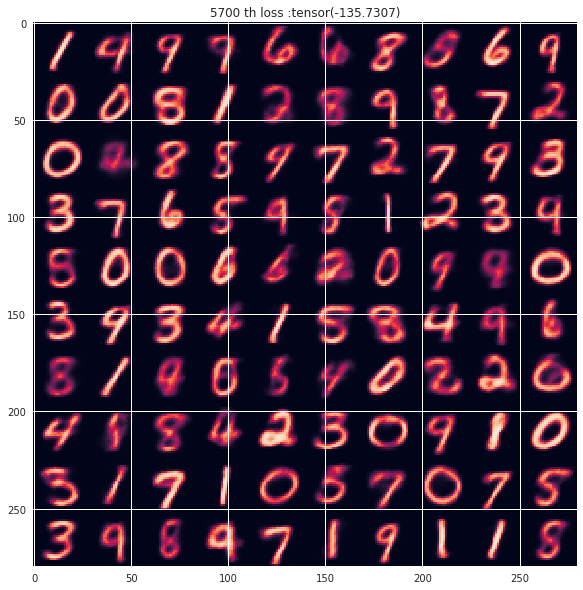

SF
tensor(-53.0552, device='cuda:0')
PD
tensor(134.4113, device='cuda:0')


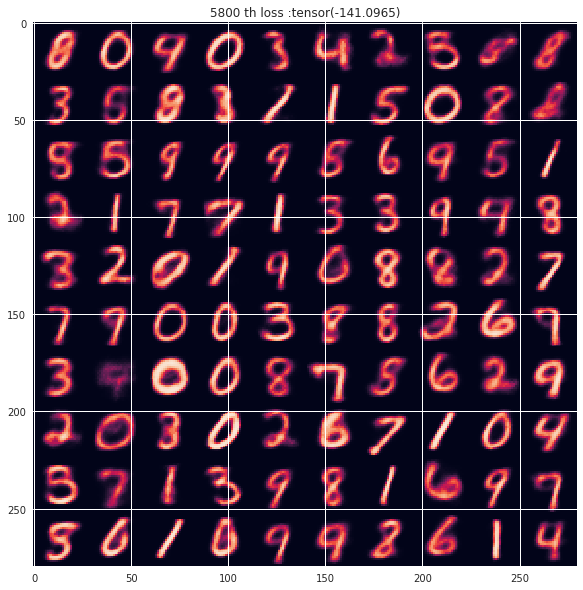

SF
tensor(-119.8290, device='cuda:0')
PD
tensor(139.0840, device='cuda:0')


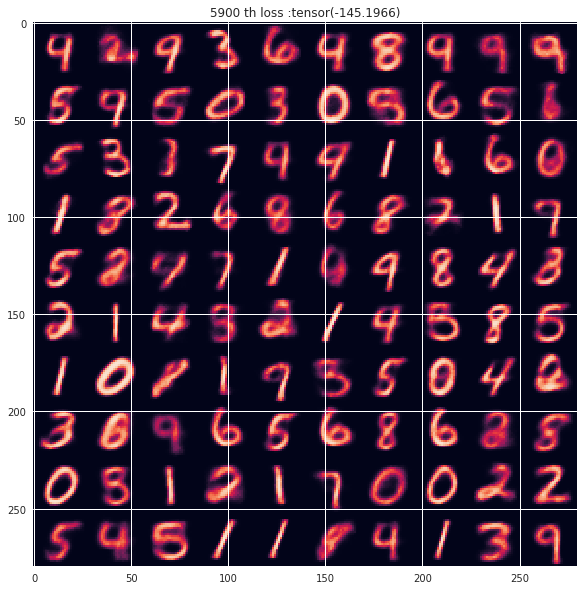

SF
tensor(-92.8909, device='cuda:0')
PD
tensor(143.5730, device='cuda:0')


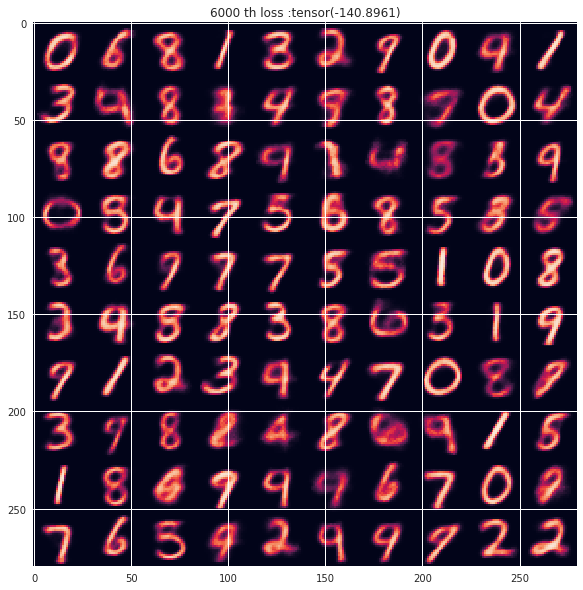

SF
tensor(-60.4669, device='cuda:0')
PD
tensor(140.1432, device='cuda:0')


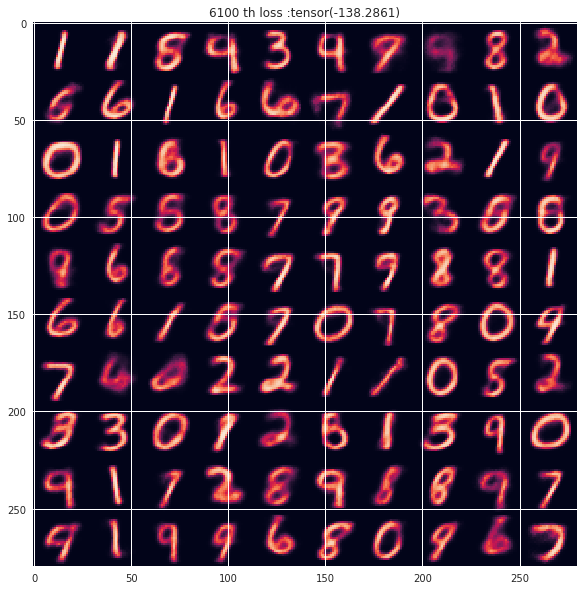

SF
tensor(-132.5047, device='cuda:0')
PD
tensor(136.3861, device='cuda:0')


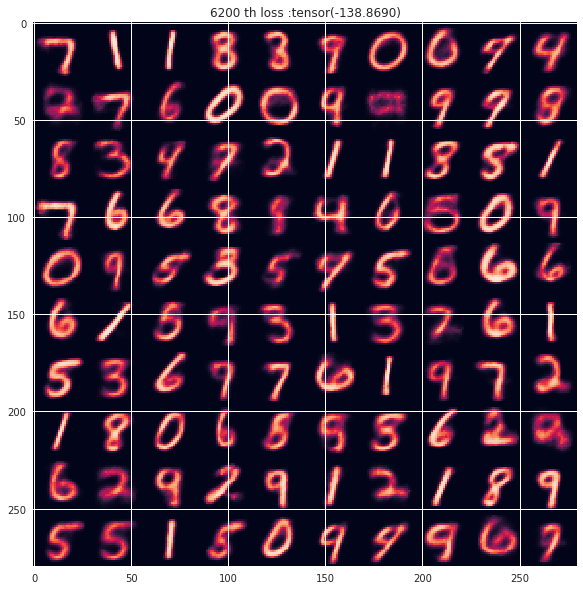

SF
tensor(-123.4490, device='cuda:0')
PD
tensor(137.0586, device='cuda:0')


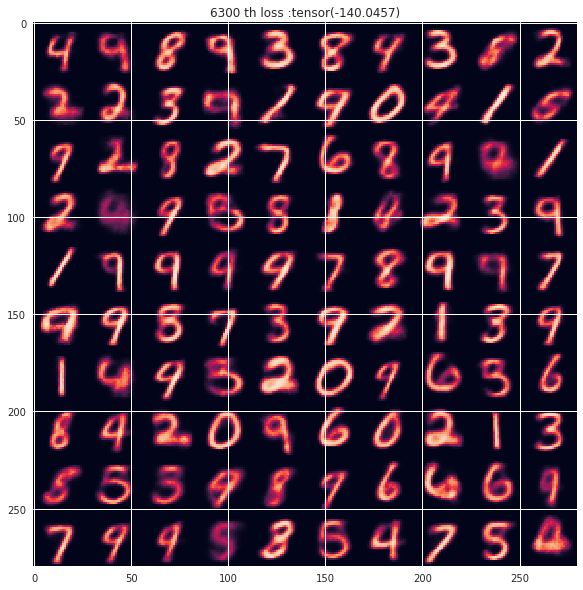

SF
tensor(-93.7851, device='cuda:0')
PD
tensor(137.9798, device='cuda:0')


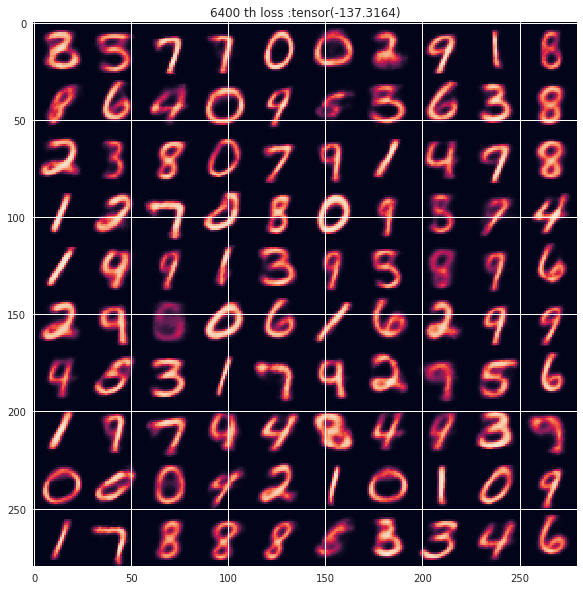

SF
tensor(-96.5233, device='cuda:0')
PD
tensor(135.5983, device='cuda:0')


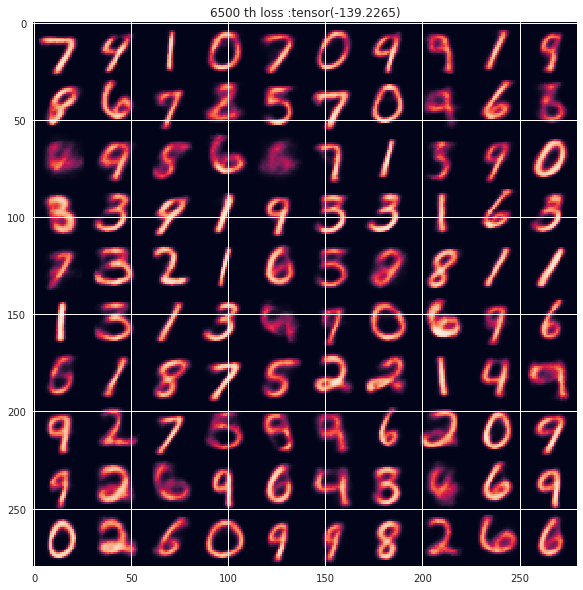

SF
tensor(-63.4000, device='cuda:0')
PD
tensor(137.6206, device='cuda:0')


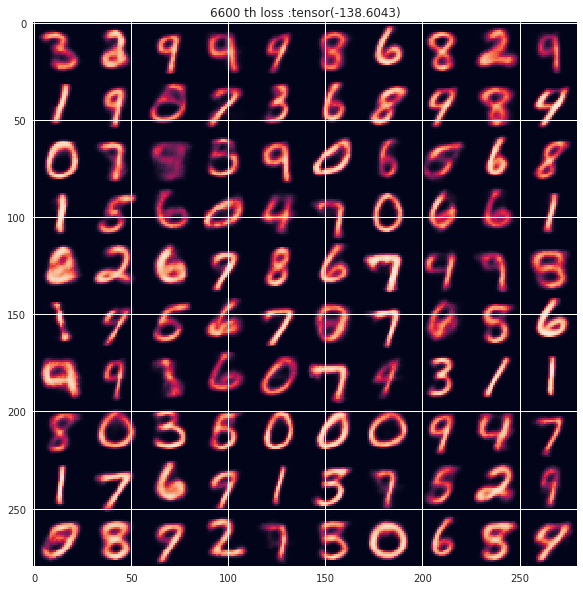

SF
tensor(-94.5981, device='cuda:0')
PD
tensor(136.5002, device='cuda:0')


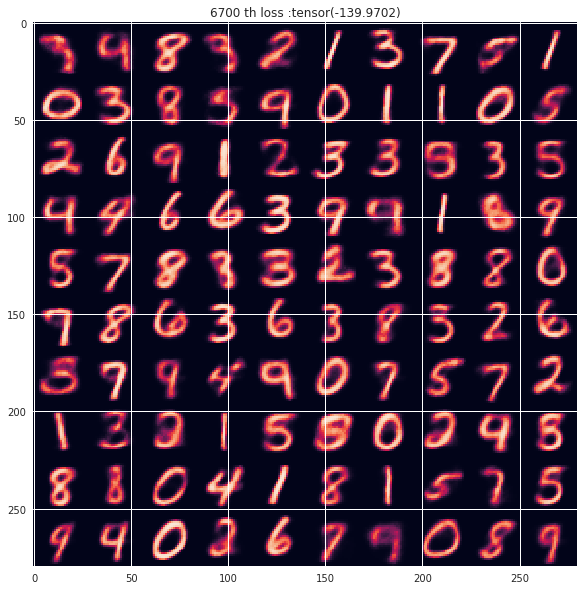

SF
tensor(-90.0833, device='cuda:0')
PD
tensor(138.3655, device='cuda:0')


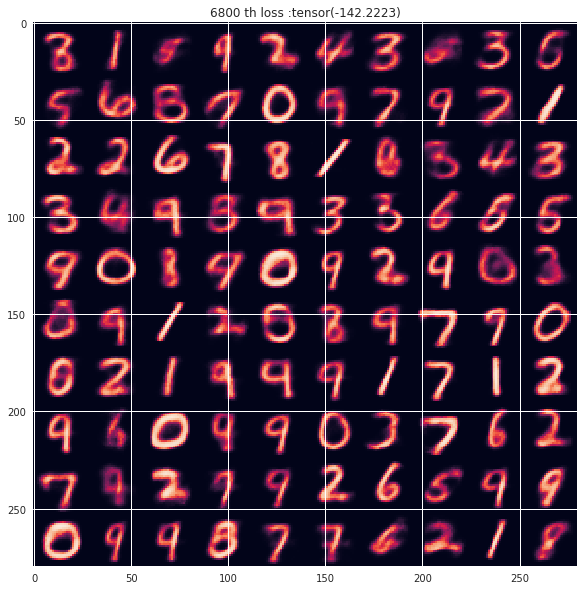

SF
tensor(-100.2048, device='cuda:0')
PD
tensor(140.7064, device='cuda:0')


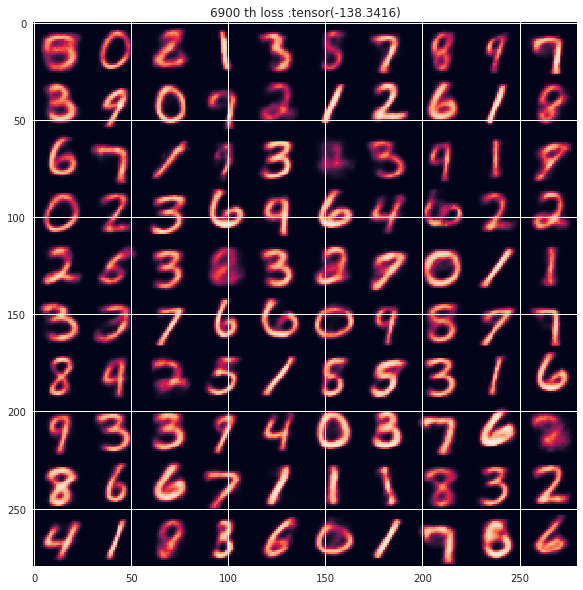

SF
tensor(-95.5634, device='cuda:0')
PD
tensor(136.7865, device='cuda:0')


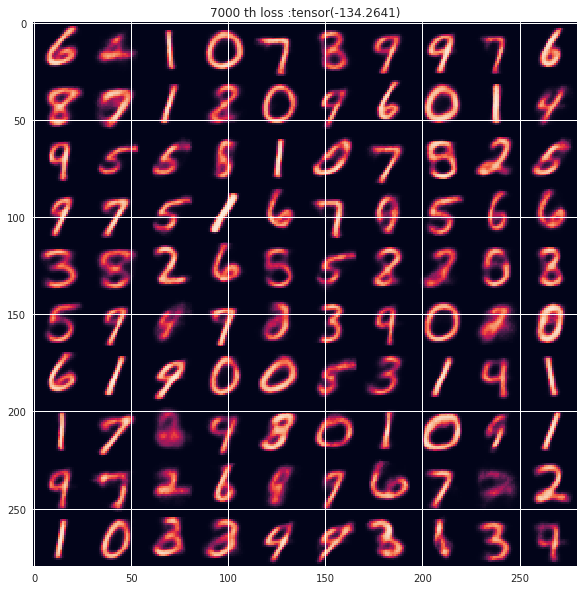

SF
tensor(-76.8773, device='cuda:0')
PD
tensor(132.9279, device='cuda:0')


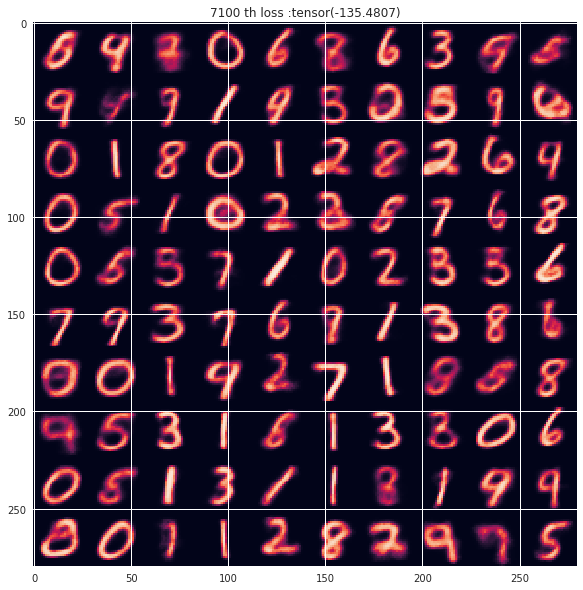

SF
tensor(-89.0655, device='cuda:0')
PD
tensor(134.4435, device='cuda:0')


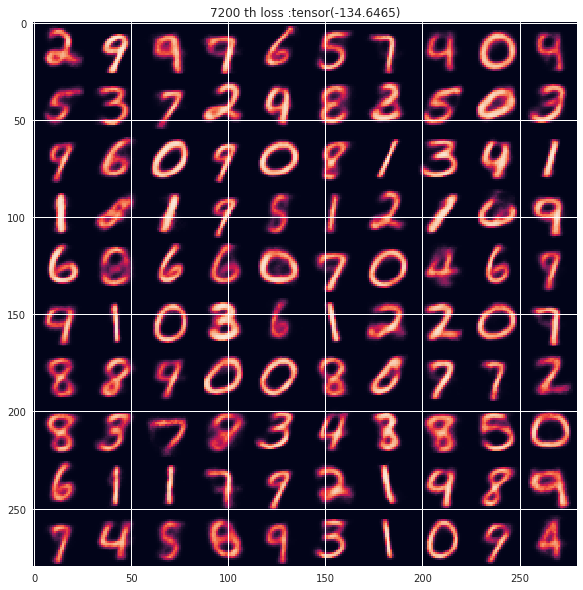

SF
tensor(-84.3291, device='cuda:0')
PD
tensor(133.4271, device='cuda:0')


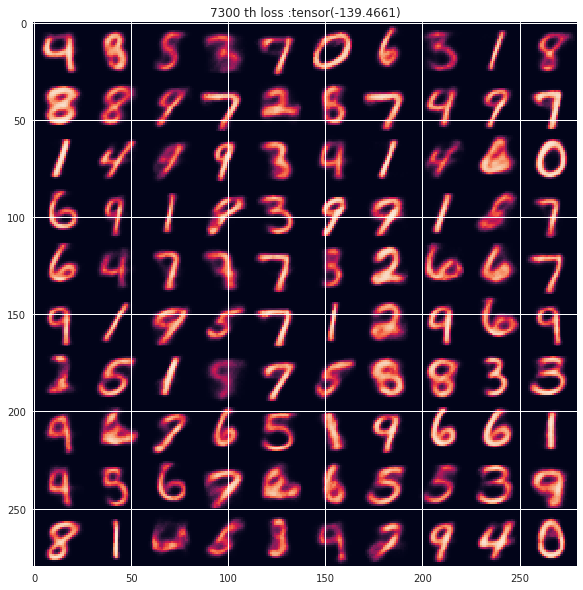

SF
tensor(-59.5972, device='cuda:0')
PD
tensor(137.7746, device='cuda:0')


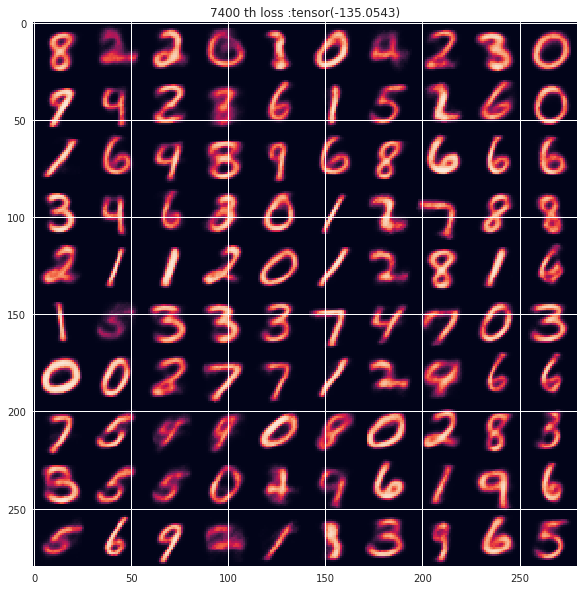

SF
tensor(-108.5426, device='cuda:0')
PD
tensor(133.8514, device='cuda:0')


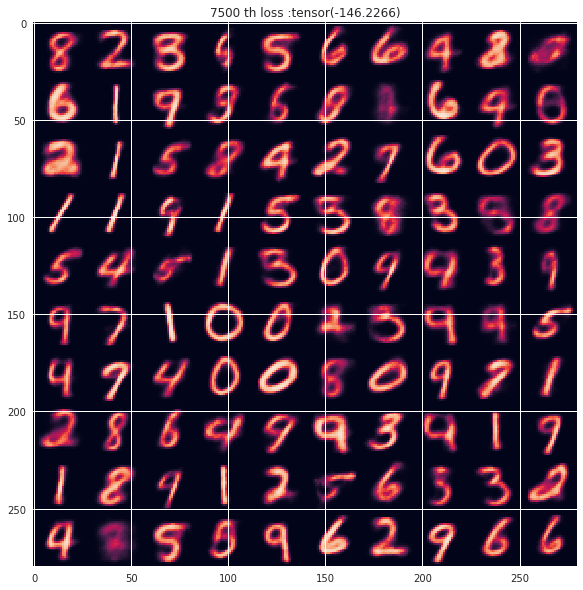

SF
tensor(-94.6865, device='cuda:0')
PD
tensor(143.6945, device='cuda:0')


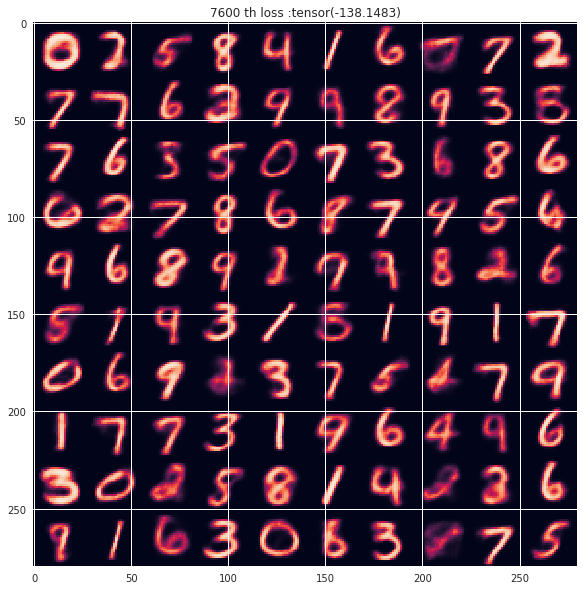

SF
tensor(-58.8335, device='cuda:0')
PD
tensor(136.3694, device='cuda:0')


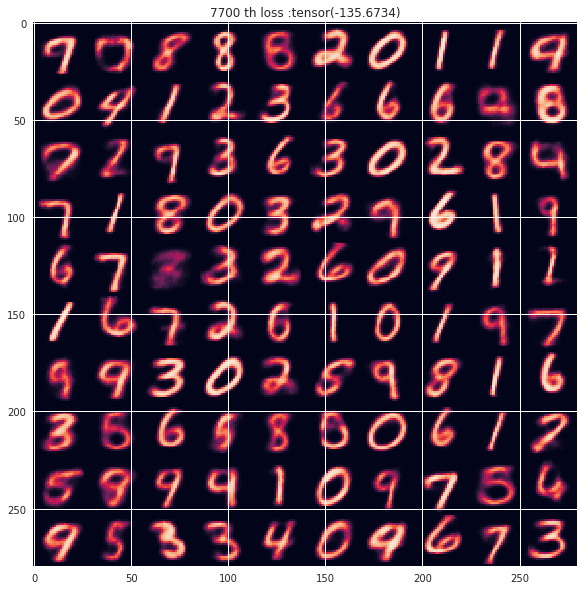

SF
tensor(-101.8465, device='cuda:0')
PD
tensor(134.6721, device='cuda:0')


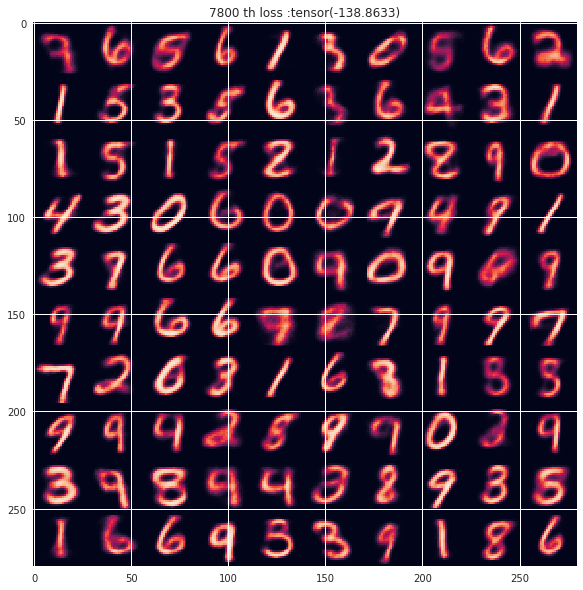

SF
tensor(-122.6554, device='cuda:0')
PD
tensor(137.2375, device='cuda:0')


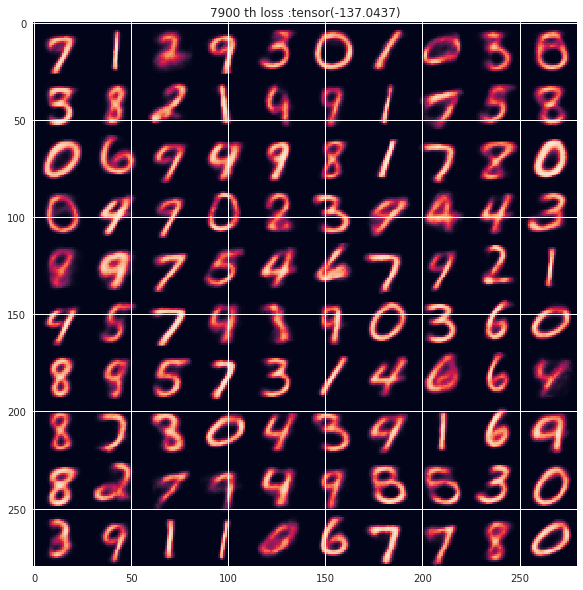

SF
tensor(-143.0073, device='cuda:0')
PD
tensor(135.9354, device='cuda:0')


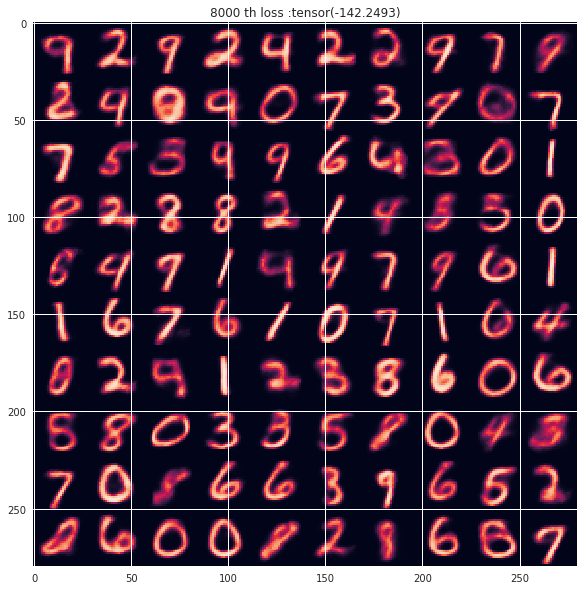

SF
tensor(-105.7811, device='cuda:0')
PD
tensor(140.2357, device='cuda:0')


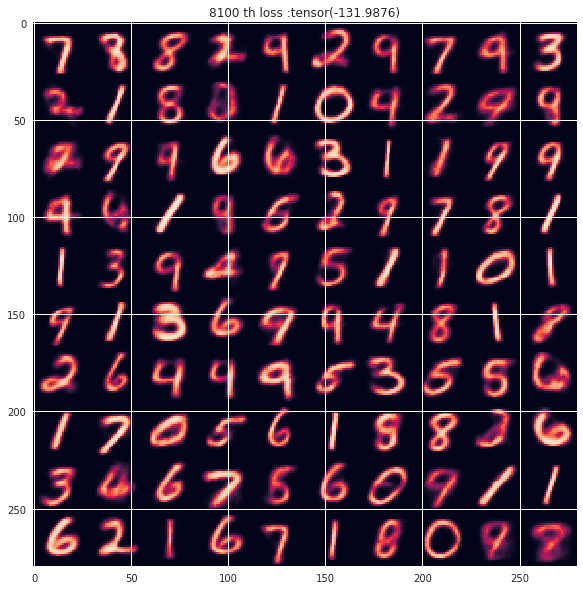

SF
tensor(-80.4873, device='cuda:0')
PD
tensor(130.2591, device='cuda:0')


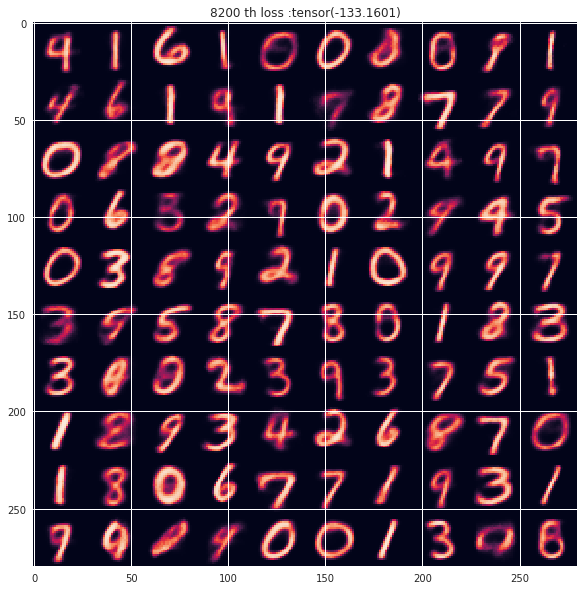

SF
tensor(-92.8186, device='cuda:0')
PD
tensor(131.4493, device='cuda:0')


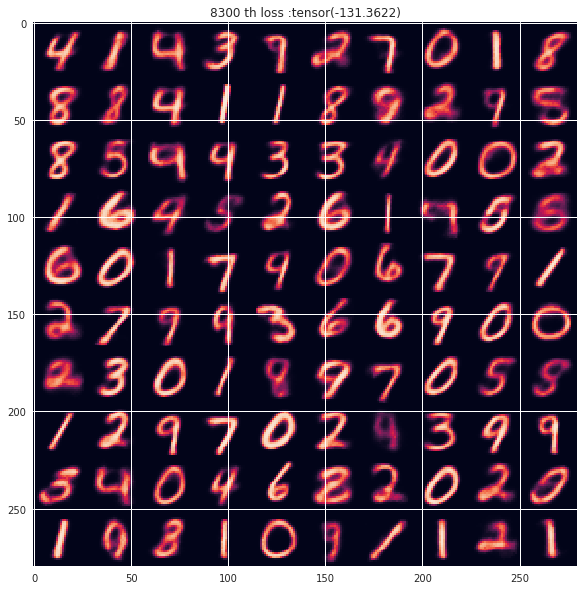

SF
tensor(-80.3438, device='cuda:0')
PD
tensor(129.9340, device='cuda:0')


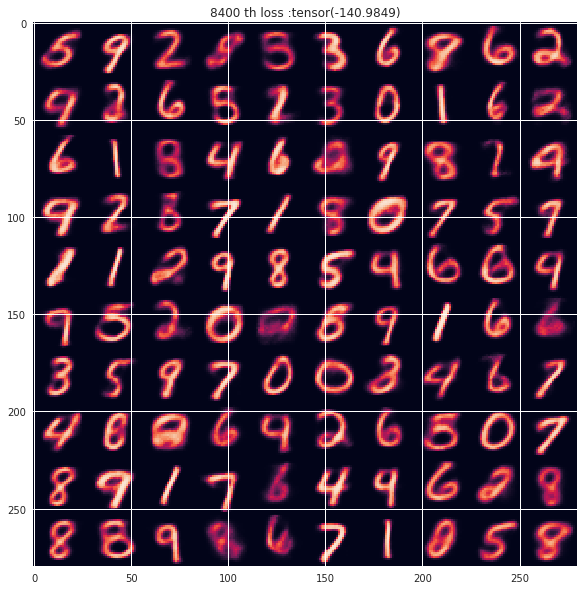

SF
tensor(-85.3158, device='cuda:0')
PD
tensor(139.2554, device='cuda:0')


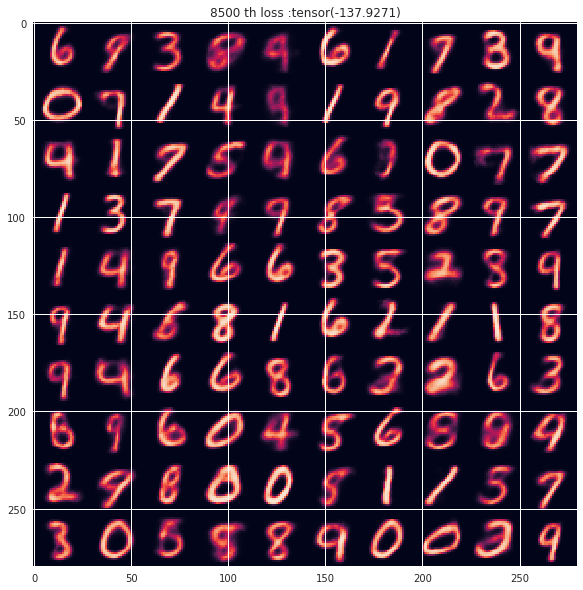

SF
tensor(-117.7830, device='cuda:0')
PD
tensor(136.6117, device='cuda:0')


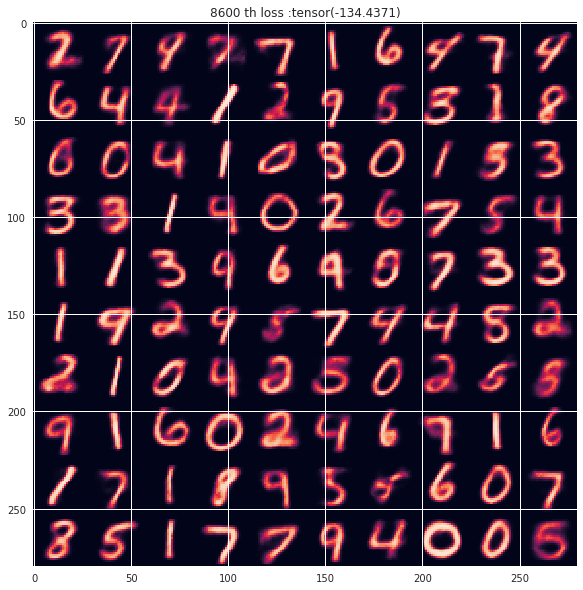

SF
tensor(-116.7731, device='cuda:0')
PD
tensor(133.1284, device='cuda:0')


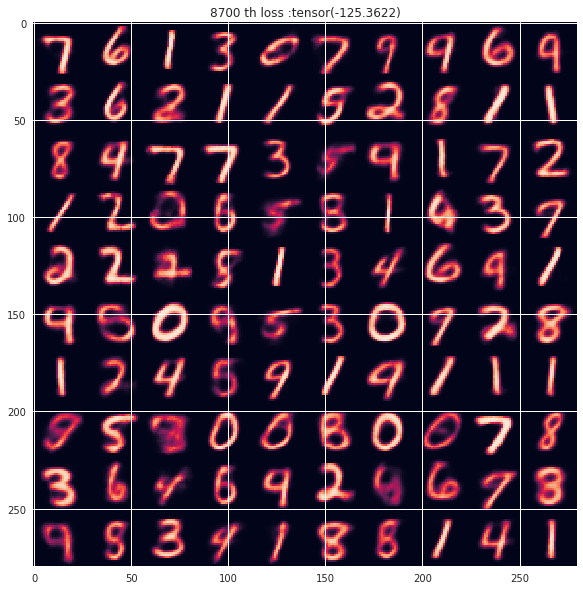

SF
tensor(-95.1476, device='cuda:0')
PD
tensor(123.9395, device='cuda:0')


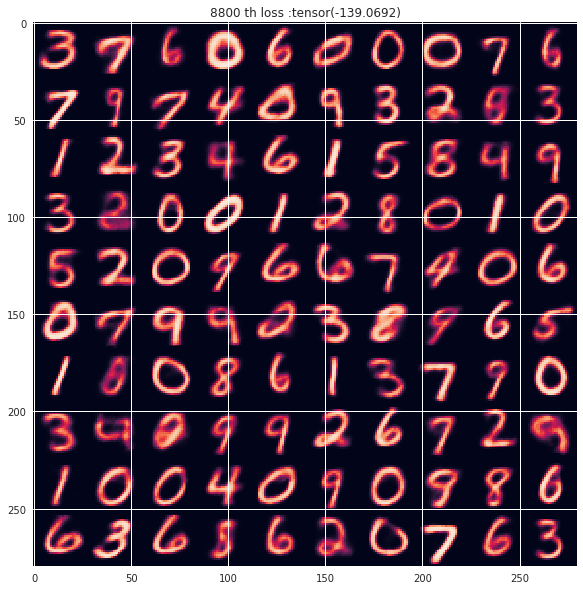

SF
tensor(-113.8240, device='cuda:0')
PD
tensor(137.4999, device='cuda:0')


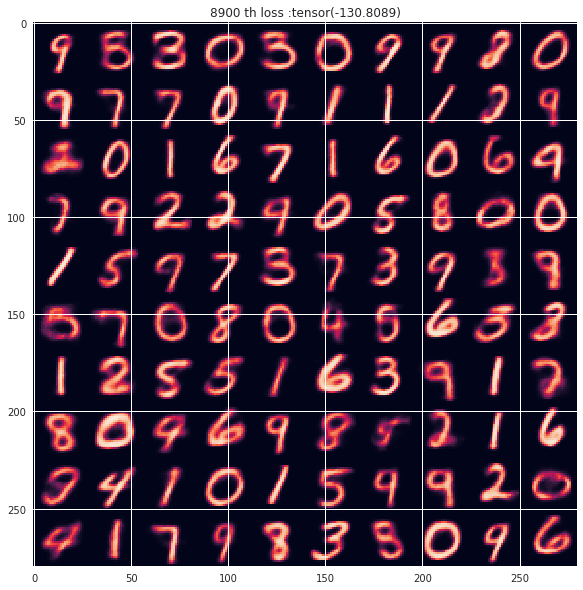

SF
tensor(-97.3162, device='cuda:0')
PD
tensor(129.3867, device='cuda:0')


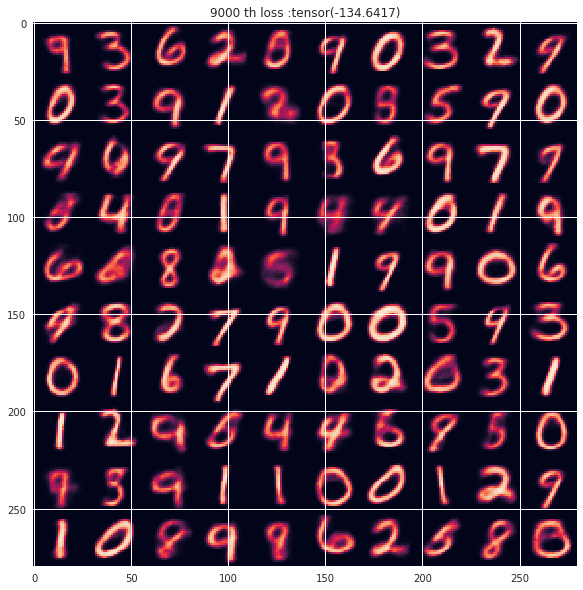

SF
tensor(-107.2554, device='cuda:0')
PD
tensor(132.8345, device='cuda:0')


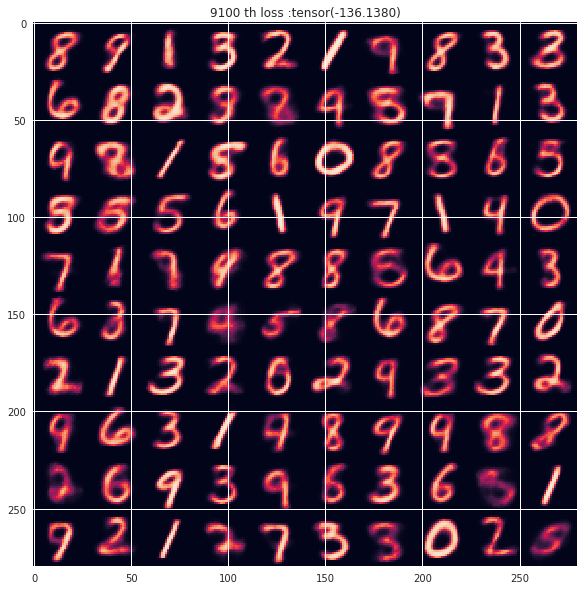

SF
tensor(-92.6167, device='cuda:0')
PD
tensor(134.1559, device='cuda:0')


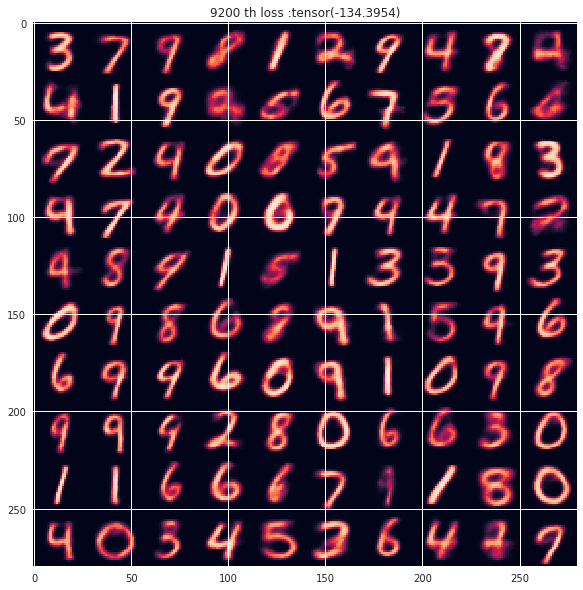

SF
tensor(-96.9728, device='cuda:0')
PD
tensor(132.5530, device='cuda:0')


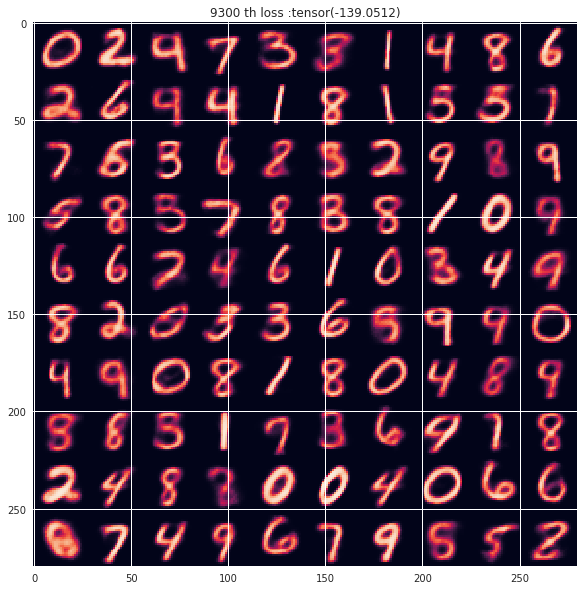

SF
tensor(-67.1829, device='cuda:0')
PD
tensor(136.9759, device='cuda:0')


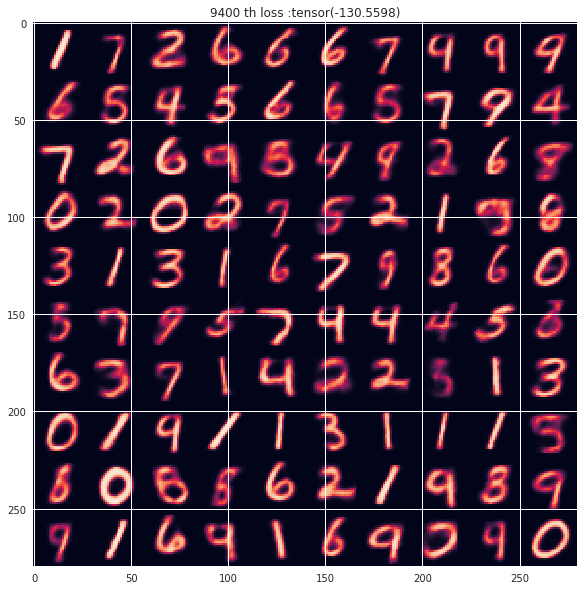

SF
tensor(-73.8598, device='cuda:0')
PD
tensor(128.5238, device='cuda:0')


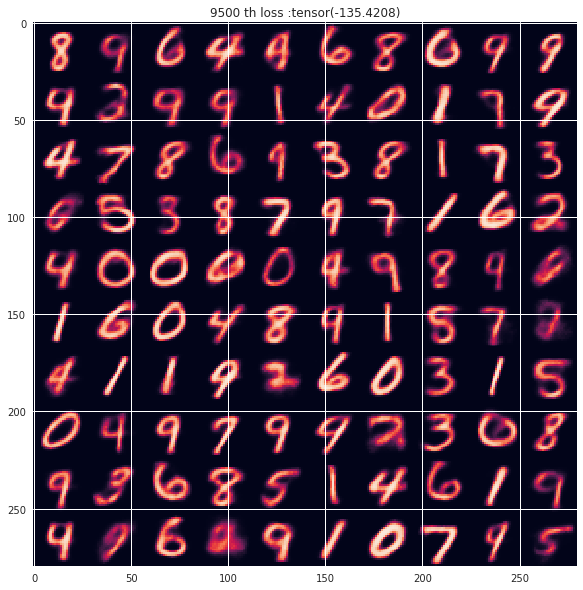

SF
tensor(-118.7783, device='cuda:0')
PD
tensor(133.8158, device='cuda:0')


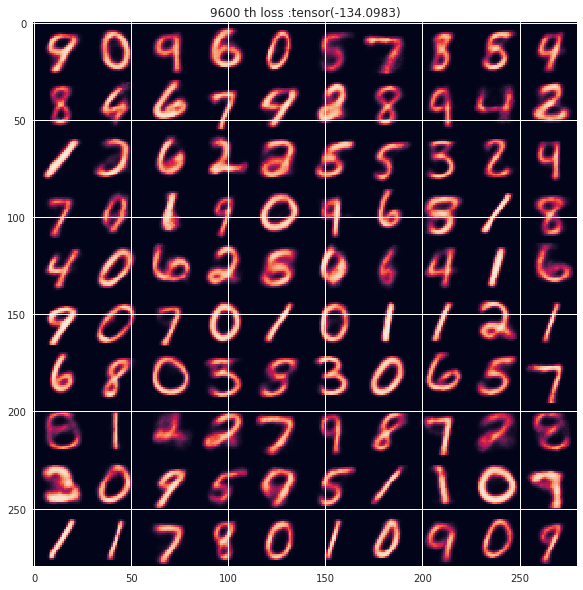

SF
tensor(-95.9765, device='cuda:0')
PD
tensor(132.3081, device='cuda:0')


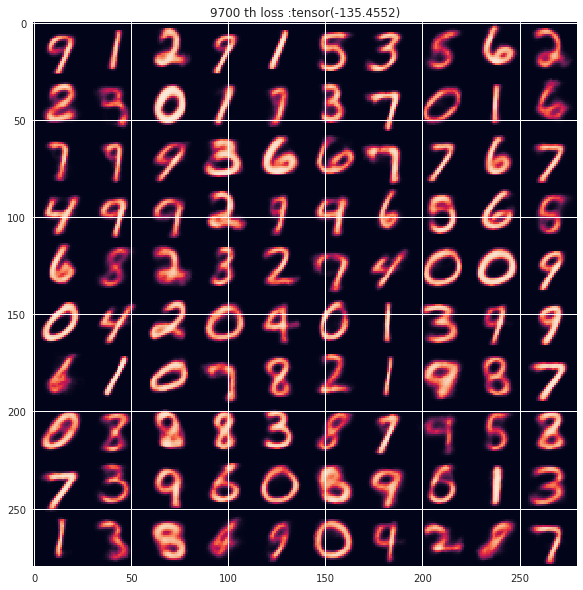

SF
tensor(-90.0226, device='cuda:0')
PD
tensor(134.0730, device='cuda:0')


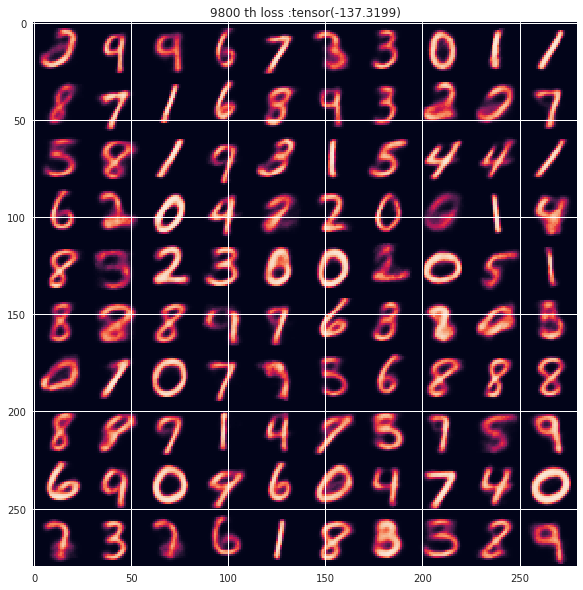

SF
tensor(-95.7476, device='cuda:0')
PD
tensor(135.4730, device='cuda:0')


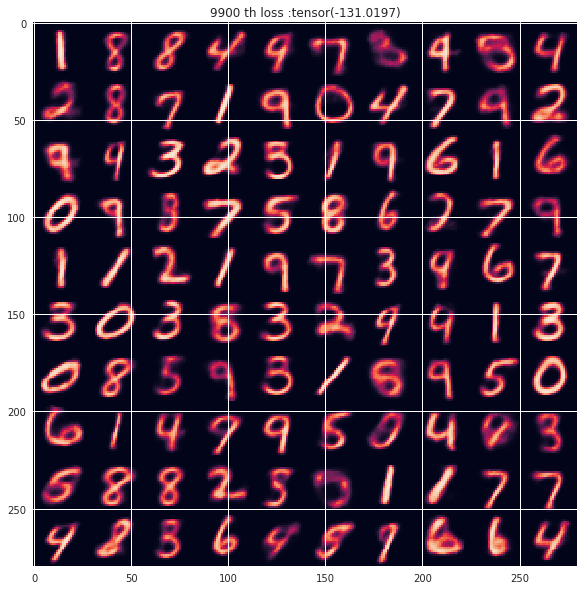

SF
tensor(-75.7943, device='cuda:0')
PD
tensor(130.1541, device='cuda:0')


In [9]:
video_path = './PD.mp4'
writer = skvideo.io.FFmpegWriter(video_path)
losses = list()

for i in range(NUM_ITERS):
    np_x, np_y = data.next_batch(BATCH_SIZE)
    np_x = Variable(torch.FloatTensor(np_x)).cuda()
    q_y = en(np_x)
    
    u = torch.rand((BATCH_SIZE, N*K)).cuda()
    v = torch.rand((BATCH_SIZE, N*K)).cuda()
    
    b_soft = F.softmax(sample_z(u.view(-1,1), q_y.view(-1,1)).view(-1,K)/LAMBDA, dim=1)
    b, ind = H(sample_z(u.view(-1,1), q_y.view(-1,1)).view(-1,K))
    b_soft_cond = F.softmax(sample_zb(v.view(-1,1), q_y.view(-1,1),\
                                      b.view(-1,1).detach(), ind.detach()).view(-1,K)/LAMBDA, dim=1)
#     print('qy')
#     print(q_y[:10])
#     print('v')
#     print(v[0][:10])
#     print('b')
#     print(b[0])
#     print('b_soft')
#     print(b_soft[0])
#     print('ind')
#     print(ind[0])
#     print('b_soft_cond')
#     print(b_soft_cond[0])
    
    elbo_b, logits_b = compute_elbo(b, np_x, q_y.view(-1,N*K))
    elbo_b_soft, logits_b_soft = compute_elbo(b_soft, np_x, q_y.view(-1,N*K))
    elbo_b_soft_cond, logits_b_soft_cond = compute_elbo(b_soft_cond, np_x, q_y.view(-1,N*K))
    
#     print(elbo_b[0])
#     print(elbo_b_soft[0])
#     print(elbo_b_soft_cond[0])
    
#     cov = np.cov(np.vstack((elbo_b.data.cpu().view(-1).numpy(), elbo_b_soft.data.cpu().view(-1).numpy())))
#     ETA = float(cov[0][1]/cov[1][1])
    
    log_like = (torch.log(q_y).view(-1,N*K) * b.view(-1,N*K)).sum(dim=1)
    SF = (-1* ( elbo_b - ETA * elbo_b_soft_cond ).detach() * log_like).mean()
    PD = (-1 * ETA * ( elbo_b_soft  )).mean()
    elbo_b_, logits_b_ = compute_elbo(b, np_x, q_y.view(-1,N*K))

    loss =  PD - elbo_b_.mean()
    
    en_opt.zero_grad()
    de_opt.zero_grad()
    loss.backward()
    en_opt.step()
    de_opt.step()
    
    l = elbo_b.cpu().data.mean()
    losses.append(l)
    
    if (i%100)==0:
        # make figure
        fig = plt.figure()
        x_img = F.sigmoid(logits_b.data).view(10,10,28,28)
        # split into 10 (1,10,28,28) images, concat along columns -> 1,10,28,280
        x_img = np.concatenate(np.split(x_img,10,axis=0),axis=3)
        # split into 10 (1,1,28,280) images, concat along rows -> 1,1,280,280
        x_img = np.concatenate(np.split(x_img,10,axis=1),axis=2)
        x_img = np.squeeze(x_img)
        plt.imshow(x_img)
        
        plt.title(str(i)+' th loss :'+ str(l))
        fig.canvas.draw()

        # Get the RGBA buffer from the figure
        w,h = fig.canvas.get_width_height()
        buf = np.fromstring(fig.canvas.tostring_argb(), dtype=np.uint8)
        buf.shape = (h, w, 4)
        plot = buf[:, :, 1:]
        plt.show()
        plt.close()
        outputframe = np.zeros((h, w, 3))
        outputframe[:, :] = plot
        writer.writeFrame(outputframe)
        
        print('SF')
        print(SF)
        print('PD')
        print(PD)
    
writer.close()

In [10]:
video = io.open('./PD.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


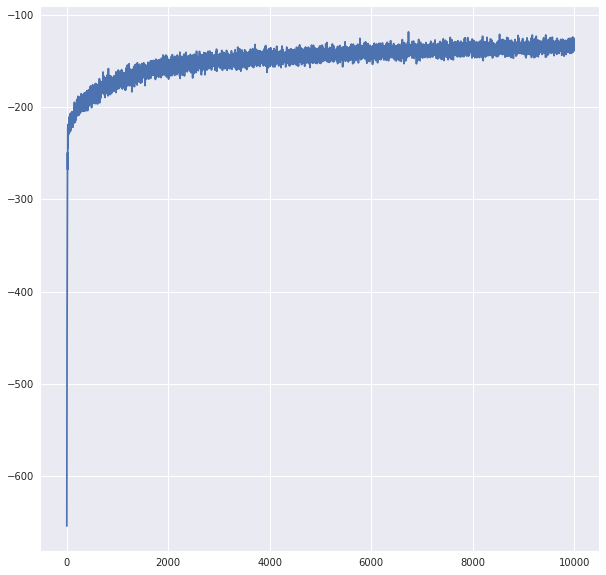

In [11]:
plt.plot(range(len(losses)), losses)
plt.show()